#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [1]:
import os
import pickle
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np
import pandas as pd
import json

import torch
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [2]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001",
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params": {
        "linear_filters": [1024, 1024, 1024, 1024],
        "input_feat": 36,
        "dropout": 0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [3]:
def save_model(model, model_name, unique_name, fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH, exist_ok=True)
    torch.save({
        "n_epochs": config["n_epochs"],
        "model_state_dict": model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")


model_iden = "fold"
notebook_iden = "SORTModel_feature"
models_saves = "model_saves"

In [4]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:300: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [5]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024, 1024, 1024, 2048], input_feat=36, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat, linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0], linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1], linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2] + linear_filters[1] + linear_filters[0], linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu

    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1, out2, out3], -1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [6]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [7]:
emb = model(torch.randn((32, 36)))
emb.size()

torch.Size([32, 1024])

In [8]:
emb

tensor([[9.7115e-01, 0.0000e+00, 0.0000e+00,  ..., 1.4610e+00, 4.6878e-01,
         4.1518e-01],
        [1.4912e+00, 0.0000e+00, 1.1265e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 4.5791e-01,  ..., 0.0000e+00, 1.0272e-03,
         1.2502e+00],
        ...,
        [3.5709e-01, 0.0000e+00, 0.0000e+00,  ..., 5.0015e-01, 6.4292e-01,
         1.1549e+00],
        [0.0000e+00, 1.1422e-01, 3.8564e-01,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 6.9761e-01,  ..., 8.0294e-01, 0.0000e+00,
         1.1763e+00]], grad_fn=<ReluBackward0>)

---

In [9]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [10]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [11]:
dataReader.data.shape

(124,)

In [12]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'],
                ['walking', 'rope jumping', 'sitting', 'descending stairs'],
                ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'],
                ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [13]:
dts = PAMAP2Dataset

In [14]:
import pickle

with open("prototypes/bidiretional_lstm_hrnet_nturgb/epoch10_emb1024_xy/without_pretrain_on_local.pkl","rb") as f0:
    prototype_map = pickle.load(f0)

In [15]:
video_data = prototype_map
video_classes, video_feat = np.asarray(list(prototype_map.keys())), np.asarray(list(prototype_map.values()))

In [16]:
video_feat.shape,list(prototype_map.keys())

((18, 1024),
 ['ascending stairs',
  'car driving',
  'computer work',
  'cycling',
  'descending stairs',
  'folding laundry',
  'house cleaning',
  'ironing',
  'lying',
  'Nordic walking',
  'playing soccer',
  'rope jumping',
  'running',
  'sitting',
  'standing',
  'vacuum cleaning',
  'walking',
  'watching TV'])

In [17]:
video_classes,len(np.unique(video_classes))

(array(['ascending stairs', 'car driving', 'computer work', 'cycling',
        'descending stairs', 'folding laundry', 'house cleaning',
        'ironing', 'lying', 'Nordic walking', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 18)

In [18]:
vid_cls_name = np.unique(video_classes)

In [19]:
def selecting_video_prototypes(prototypes: np.array, classes: np.array, vid_class_name: np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [22]:
selecting_video_prototypes(video_feat, video_classes, vid_cls_name).shape

torch.Size([18, 1024])

In [26]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [27]:
video_classes

array(['ascending stairs', 'car driving', 'computer work', 'cycling',
       'descending stairs', 'folding laundry', 'house cleaning',
       'ironing', 'lying', 'Nordic walking', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [37]:
from collections import defaultdict

label2Id = {c[1]: i for i, c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [38]:
action_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [39]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21,
                                window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [40]:
data_dict.keys()

dict_keys(['train', 'eval-seen', 'test', 'seen_classes', 'unseen_classes'])

In [41]:
data_dict['train']['X'].shape, data_dict['eval-seen']['X'].shape, data_dict["test"]["X"].shape

((16752, 36), (4189, 36), (5608, 36))

In [42]:
data_dict['train']['X'].shape[0] + data_dict['eval-seen']['X'].shape[0] + data_dict["test"]["X"].shape[0]

26549

In [43]:
action_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [48]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [49]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat,
                          attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100 * np.isinf(d[0].numpy()).sum() / (d[0].shape[0] * d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [50]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [51]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [52]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 1024])

In [53]:
def loss_cross_entropy(
        y_pred: torch.Tensor,
        cls: torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.softmax(F.cosine_similarity(entry.repeat(num_classes, 1), selected_features), dim=-1)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb, cls)
    #print(loss)
    return loss


def predict_class(
        y_pred: torch.Tensor,
        selected_features):
    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(
            F.softmax(F.cosine_similarity(entry.repeat(num_classes, 1), selected_features), dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [54]:
def loss_reconstruction_calc(y_pred: torch.Tensor, y_feat: torch.Tensor, loss_fn=nn.L1Loss(reduction="sum")):
    bat_size, feature_size = y_pred.size()
    loss = loss_fn(y_pred, y_feat) * (1 / feature_size)
    #print(loss)
    return loss

In [55]:
def train_step(model, dataloader, dataset: PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train',
               l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
                # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output, targets.squeeze(), random_selected_feat,
                                                loss_fn=loss_module['class'])
                feat_loss = loss_reconstruction_calc(feat_output, target_feat, loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha * class_loss
            class_output = predict_class(feat_output, random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [56]:
def eval_step(model, dataloader, dataset, loss_module, device, class_names, phase='seen', l2_reg=False,
              print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
                # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output, targets.squeeze(), random_selected_feat,
                                                loss_fn=loss_module['class'])
                feat_loss = loss_reconstruction_calc(feat_output, target_feat, loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha * class_loss
            class_output = predict_class(feat_output, random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names,
                                    print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 1024])



train: 100%|██████████| 261/261 [00:40<00:00,  6.38batch/s, loss=319, accuracy=0.781]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.77batch/s, loss=336]


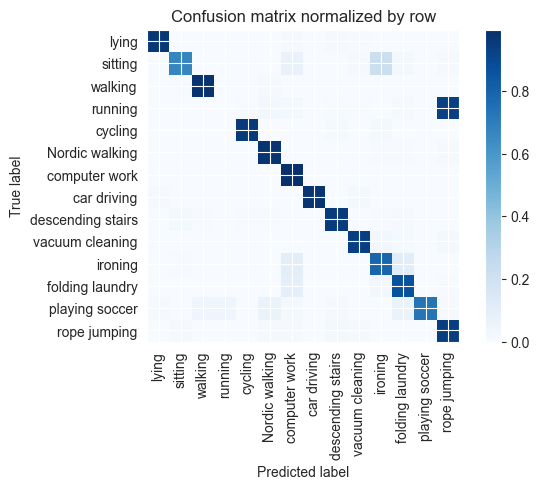

Training Epoch:   7%|▋         | 1/15 [00:46<10:52, 46.58s/it]

Overall accuracy: 0.869

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.857      0.995      0.921      0.144        600|	 ironing: 0.003,	vacuum cleaning: 0.002,	
          walking       0.987      0.981      0.984      0.113        468|	 Nordic walking: 0.009,	sitting: 0.004,	
          ironing       0.775      0.788      0.782      0.111        463|	 folding laundry: 0.106,	computer work: 0.097,	
            lying       0.995      0.965      0.980      0.090        375|	 computer work: 0.011,	descending stairs: 0.008,	
          sitting       0.957      0.669      0.787      0.087        362|	 ironing: 0.215,	computer work: 0.066,	
   Nordic walking       0.951      0.975      0.963      0.086        358|	 rope jumping: 0.008,	folding laundry: 0.006,	
  vacuum cleaning       0.964      0.933      0.948      0.083        344|	 ironing: 0.029,	rope jumping: 0.017,	
          cycling       0.987      0.957      0.97


train: 100%|██████████| 261/261 [00:34<00:00,  7.66batch/s, loss=315, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.63batch/s, loss=317]


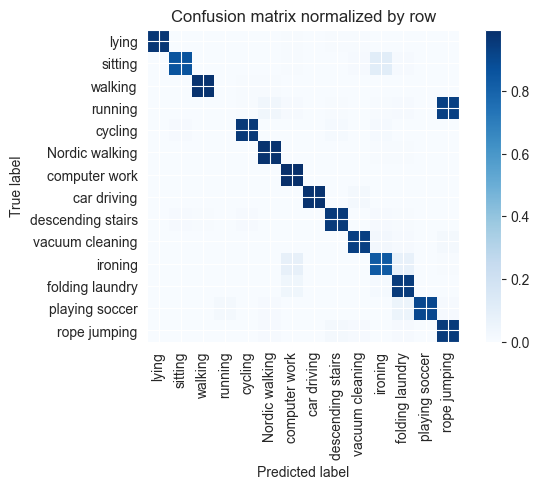

Training Epoch:  13%|█▎        | 2/15 [01:25<09:05, 41.93s/it]

Overall accuracy: 0.900

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.922      0.995      0.957      0.145        603|	 ironing: 0.003,	folding laundry: 0.002,	
          walking       0.996      0.983      0.989      0.113        469|	 Nordic walking: 0.006,	cycling: 0.004,	
          ironing       0.860      0.834      0.847      0.112        465|	 computer work: 0.080,	folding laundry: 0.077,	
            lying       1.000      0.968      0.984      0.089        371|	 vacuum cleaning: 0.005,	descending stairs: 0.005,	
          sitting       0.972      0.856      0.910      0.087        360|	 ironing: 0.108,	vacuum cleaning: 0.011,	
   Nordic walking       0.962      0.983      0.972      0.086        358|	 folding laundry: 0.006,	ironing: 0.006,	
  vacuum cleaning       0.970      0.936      0.953      0.083        346|	 ironing: 0.026,	rope jumping: 0.020,	
          cycling       0.978      0.957      0.967


train: 100%|██████████| 261/261 [00:35<00:00,  7.33batch/s, loss=313, accuracy=0.922]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 15.18batch/s, loss=318]


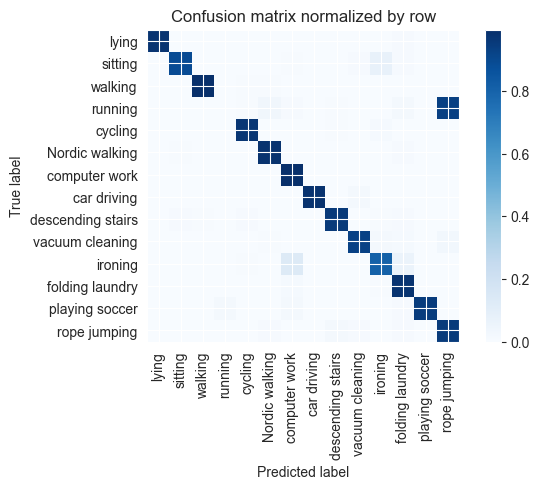

Training Epoch:  20%|██        | 3/15 [02:05<08:14, 41.19s/it]

Overall accuracy: 0.904

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.895      0.995      0.942      0.144        599|	 folding laundry: 0.003,	sitting: 0.002,	
          walking       0.996      0.992      0.994      0.113        471|	 Nordic walking: 0.004,	cycling: 0.004,	
          ironing       0.899      0.808      0.851      0.111        463|	 computer work: 0.125,	folding laundry: 0.058,	
            lying       1.000      0.976      0.988      0.090        373|	 folding laundry: 0.008,	rope jumping: 0.003,	
          sitting       0.973      0.887      0.928      0.087        363|	 ironing: 0.077,	folding laundry: 0.011,	
   Nordic walking       0.964      0.983      0.974      0.086        357|	 folding laundry: 0.008,	sitting: 0.006,	
  vacuum cleaning       0.979      0.927      0.952      0.083        344|	 rope jumping: 0.029,	ironing: 0.017,	
          cycling       0.969      0.969      0.969     


train: 100%|██████████| 261/261 [00:37<00:00,  7.02batch/s, loss=334, accuracy=0.891]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.95batch/s, loss=308]


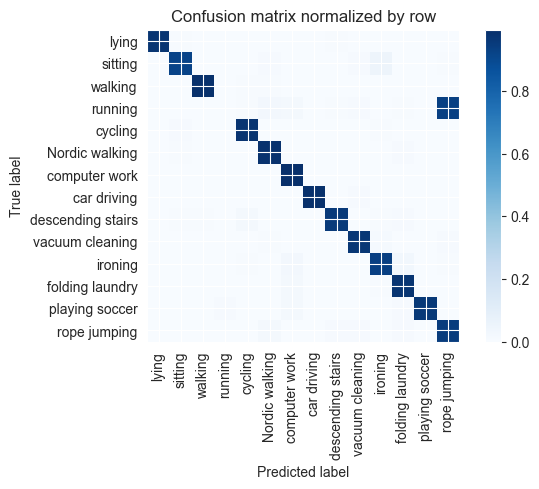

Training Epoch:  27%|██▋       | 4/15 [02:47<07:38, 41.65s/it]

Overall accuracy: 0.925

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.961      0.995      0.978      0.144        600|	 folding laundry: 0.002,	ironing: 0.002,	
          walking       0.996      0.989      0.993      0.113        471|	 cycling: 0.006,	Nordic walking: 0.004,	
          ironing       0.939      0.935      0.937      0.111        462|	 folding laundry: 0.028,	computer work: 0.026,	
            lying       1.000      0.973      0.986      0.089        371|	 descending stairs: 0.005,	sitting: 0.005,	
          sitting       0.971      0.920      0.945      0.087        363|	 ironing: 0.050,	vacuum cleaning: 0.008,	
   Nordic walking       0.957      0.983      0.970      0.087        361|	 folding laundry: 0.008,	sitting: 0.006,	
  vacuum cleaning       0.977      0.965      0.971      0.083        346|	 ironing: 0.014,	rope jumping: 0.012,	
          cycling       0.967      0.979      0.973      0.


train: 100%|██████████| 261/261 [00:36<00:00,  7.10batch/s, loss=318, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.57batch/s, loss=309]


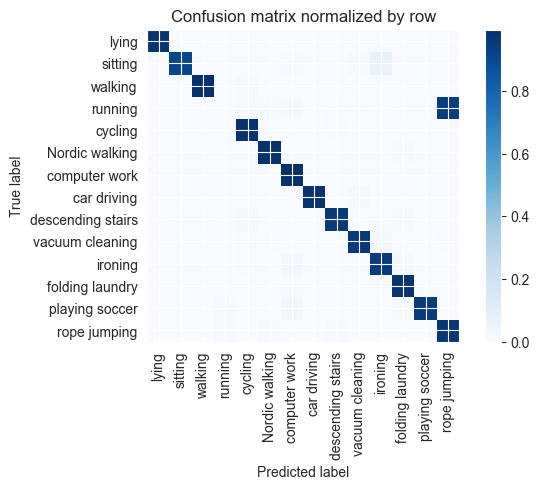

Training Epoch:  33%|███▎      | 5/15 [03:29<06:56, 41.65s/it]

Overall accuracy: 0.927

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.960      0.995      0.977      0.144        599|	 ironing: 0.003,	folding laundry: 0.002,	
          walking       0.994      0.989      0.991      0.113        471|	 cycling: 0.008,	Nordic walking: 0.002,	
          ironing       0.923      0.951      0.936      0.112        465|	 computer work: 0.026,	folding laundry: 0.017,	
            lying       0.997      0.976      0.986      0.089        372|	 rope jumping: 0.003,	playing soccer: 0.003,	
          sitting       0.988      0.909      0.947      0.087        362|	 ironing: 0.064,	vacuum cleaning: 0.008,	
   Nordic walking       0.983      0.983      0.983      0.087        360|	 folding laundry: 0.008,	rope jumping: 0.003,	
  vacuum cleaning       0.979      0.962      0.971      0.083        344|	 ironing: 0.020,	rope jumping: 0.006,	
          cycling       0.953      0.982      0.967 


train: 100%|██████████| 261/261 [00:38<00:00,  6.84batch/s, loss=317, accuracy=0.922]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.06batch/s, loss=325]


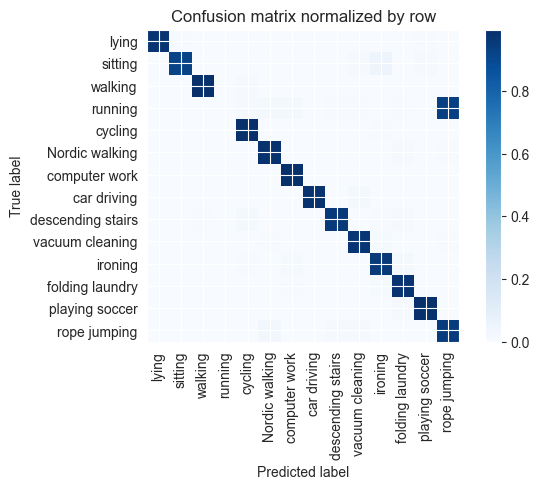

Training Epoch:  40%|████      | 6/15 [04:12<06:20, 42.24s/it]

Overall accuracy: 0.930

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.980      0.995      0.988      0.144        599|	 ironing: 0.003,	folding laundry: 0.002,	
          walking       0.996      0.989      0.993      0.113        471|	 cycling: 0.008,	Nordic walking: 0.002,	
          ironing       0.934      0.957      0.945      0.111        460|	 folding laundry: 0.020,	computer work: 0.015,	
            lying       1.000      0.978      0.989      0.089        371|	 playing soccer: 0.005,	sitting: 0.005,	
          sitting       0.988      0.917      0.951      0.087        363|	 ironing: 0.050,	vacuum cleaning: 0.011,	
   Nordic walking       0.967      0.986      0.977      0.087        361|	 folding laundry: 0.008,	rope jumping: 0.006,	
  vacuum cleaning       0.974      0.968      0.971      0.083        346|	 ironing: 0.014,	rope jumping: 0.006,	
          cycling       0.953      0.988      0.970      


train: 100%|██████████| 261/261 [00:38<00:00,  6.75batch/s, loss=342, accuracy=0.953]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.96batch/s, loss=310]


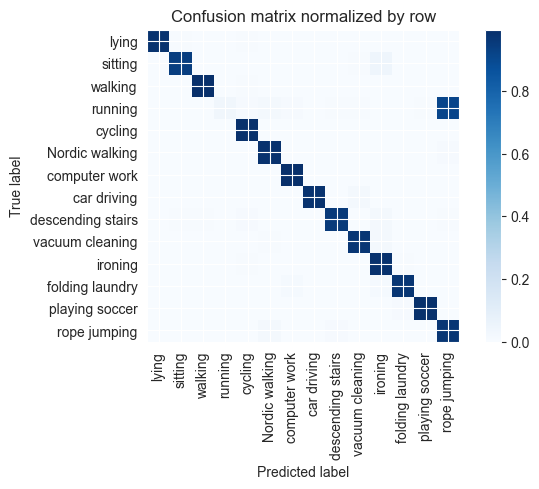

Training Epoch:  47%|████▋     | 7/15 [04:56<05:41, 42.75s/it]

Overall accuracy: 0.937

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.995      0.993      0.145        602|	 ironing: 0.003,	folding laundry: 0.002,	
          walking       0.994      0.994      0.994      0.112        466|	 cycling: 0.006,	rope jumping: 0.000,	
          ironing       0.937      0.987      0.961      0.112        464|	 folding laundry: 0.004,	cycling: 0.004,	
            lying       1.000      0.981      0.990      0.089        370|	 cycling: 0.005,	sitting: 0.005,	
          sitting       0.980      0.939      0.959      0.087        363|	 ironing: 0.044,	vacuum cleaning: 0.006,	
   Nordic walking       0.975      0.986      0.981      0.087        360|	 rope jumping: 0.011,	sitting: 0.003,	
  vacuum cleaning       0.982      0.968      0.975      0.083        344|	 ironing: 0.017,	Nordic walking: 0.006,	
          cycling       0.961      0.988      0.974      0.079        328|	 ir


train: 100%|██████████| 261/261 [00:38<00:00,  6.77batch/s, loss=308, accuracy=0.938]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.82batch/s, loss=313]


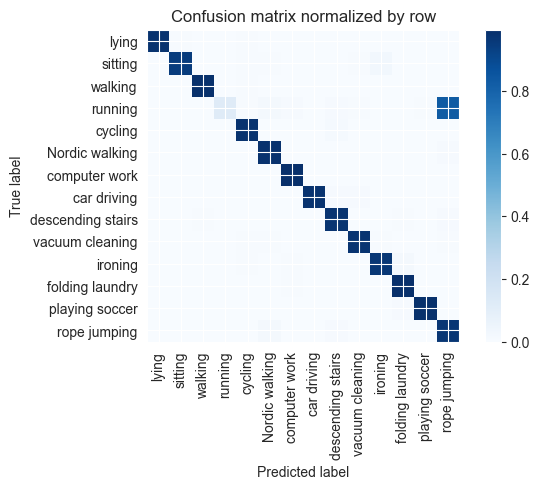

Training Epoch:  53%|█████▎    | 8/15 [05:40<05:01, 43.06s/it]

Overall accuracy: 0.941

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.988      0.995      0.992      0.145        604|	 ironing: 0.003,	folding laundry: 0.002,	
          walking       0.994      0.989      0.991      0.113        468|	 cycling: 0.006,	descending stairs: 0.002,	
          ironing       0.970      0.965      0.967      0.111        462|	 folding laundry: 0.017,	computer work: 0.006,	
            lying       1.000      0.981      0.991      0.089        372|	 cycling: 0.005,	sitting: 0.005,	
          sitting       0.994      0.948      0.970      0.087        362|	 ironing: 0.028,	vacuum cleaning: 0.006,	
   Nordic walking       0.972      0.986      0.979      0.086        358|	 rope jumping: 0.011,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.983      0.977      0.980      0.083        345|	 rope jumping: 0.006,	ironing: 0.006,	
          cycling       0.961      0.982      0.971      0.07


train: 100%|██████████| 261/261 [00:39<00:00,  6.63batch/s, loss=299, accuracy=0.953]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.70batch/s, loss=328]


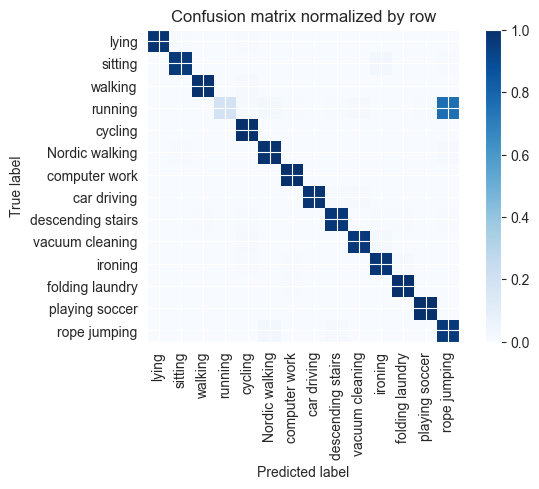

Training Epoch:  60%|██████    | 9/15 [06:25<04:21, 43.55s/it]

Overall accuracy: 0.947

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.995      0.993      0.145        602|	 folding laundry: 0.002,	ironing: 0.002,	
          walking       0.996      0.991      0.994      0.113        469|	 cycling: 0.009,	rope jumping: 0.000,	
          ironing       0.962      0.974      0.968      0.112        465|	 folding laundry: 0.011,	computer work: 0.004,	
            lying       1.000      0.984      0.992      0.089        372|	 cycling: 0.005,	sitting: 0.005,	
          sitting       0.980      0.962      0.971      0.087        364|	 ironing: 0.025,	rope jumping: 0.005,	
   Nordic walking       0.978      0.986      0.982      0.085        355|	 rope jumping: 0.008,	sitting: 0.006,	
  vacuum cleaning       0.988      0.968      0.978      0.082        343|	 ironing: 0.020,	cycling: 0.009,	
          cycling       0.956      0.994      0.975      0.079        327|	 descen


train: 100%|██████████| 261/261 [00:39<00:00,  6.65batch/s, loss=305, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.62batch/s, loss=305]


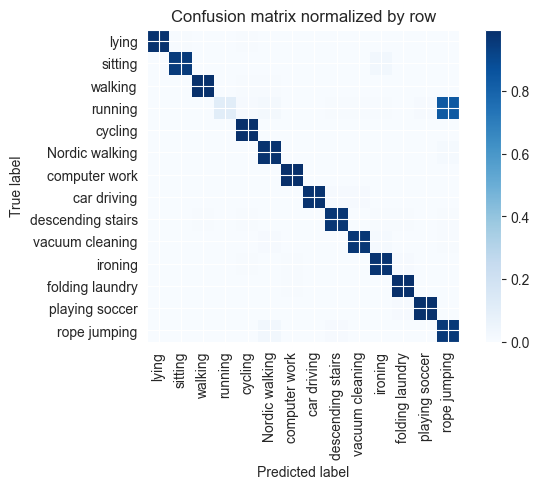

Training Epoch:  67%|██████▋   | 10/15 [07:09<03:39, 43.86s/it]

Overall accuracy: 0.942

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.997      0.994      0.144        601|	 ironing: 0.003,	rope jumping: 0.000,	
          walking       0.996      0.989      0.993      0.113        469|	 cycling: 0.006,	Nordic walking: 0.004,	
          ironing       0.958      0.978      0.968      0.111        461|	 folding laundry: 0.009,	computer work: 0.004,	
            lying       0.997      0.984      0.991      0.090        374|	 cycling: 0.005,	sitting: 0.005,	
          sitting       0.991      0.951      0.971      0.087        364|	 ironing: 0.030,	rope jumping: 0.003,	
   Nordic walking       0.964      0.983      0.974      0.086        357|	 rope jumping: 0.014,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.985      0.968      0.977      0.083        345|	 ironing: 0.014,	Nordic walking: 0.009,	
          cycling       0.964      0.994      0.979      0.079      


train: 100%|██████████| 261/261 [00:39<00:00,  6.67batch/s, loss=310, accuracy=0.984]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.47batch/s, loss=294]


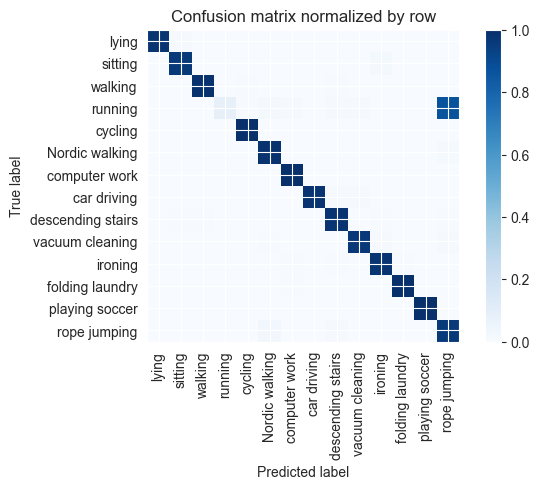

Training Epoch:  73%|███████▎  | 11/15 [07:54<02:56, 44.05s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.997      0.993      0.144        601|	 ironing: 0.003,	rope jumping: 0.000,	
          walking       0.996      0.989      0.993      0.113        469|	 descending stairs: 0.004,	cycling: 0.004,	
          ironing       0.968      0.983      0.976      0.112        466|	 folding laundry: 0.004,	descending stairs: 0.004,	
            lying       1.000      0.984      0.992      0.089        369|	 sitting: 0.008,	vacuum cleaning: 0.003,	
          sitting       0.980      0.961      0.971      0.087        363|	 ironing: 0.022,	rope jumping: 0.003,	
   Nordic walking       0.973      0.986      0.979      0.086        359|	 rope jumping: 0.014,	playing soccer: 0.000,	
  vacuum cleaning       0.985      0.968      0.977      0.083        345|	 ironing: 0.012,	rope jumping: 0.009,	
          cycling       0.982      0.994      0.988     


train: 100%|██████████| 261/261 [00:39<00:00,  6.58batch/s, loss=358, accuracy=0.969]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.61batch/s, loss=330]


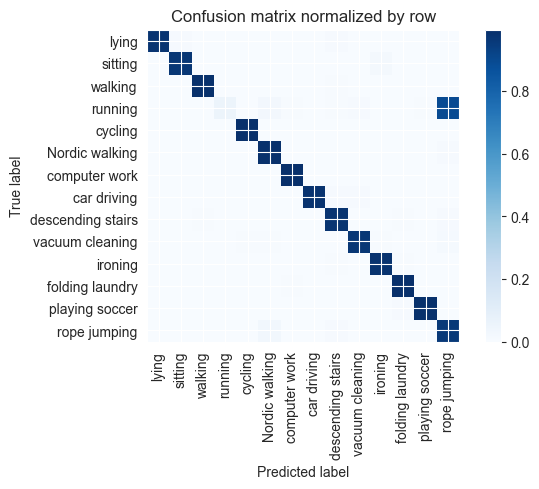

Training Epoch:  80%|████████  | 12/15 [08:39<02:13, 44.44s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.997      0.995      0.145        602|	 ironing: 0.003,	rope jumping: 0.000,	
          walking       0.996      0.991      0.994      0.113        469|	 descending stairs: 0.004,	Nordic walking: 0.002,	
          ironing       0.979      0.983      0.981      0.112        464|	 folding laundry: 0.006,	descending stairs: 0.004,	
            lying       1.000      0.978      0.989      0.089        370|	 descending stairs: 0.008,	sitting: 0.008,	
          sitting       0.989      0.967      0.978      0.087        363|	 ironing: 0.017,	rope jumping: 0.003,	
   Nordic walking       0.967      0.989      0.978      0.087        361|	 rope jumping: 0.011,	playing soccer: 0.000,	
  vacuum cleaning       0.985      0.968      0.976      0.082        343|	 rope jumping: 0.015,	ironing: 0.006,	
          cycling       0.985      0.994      0


train: 100%|██████████| 261/261 [00:39<00:00,  6.54batch/s, loss=293, accuracy=0.953]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.50batch/s, loss=309]


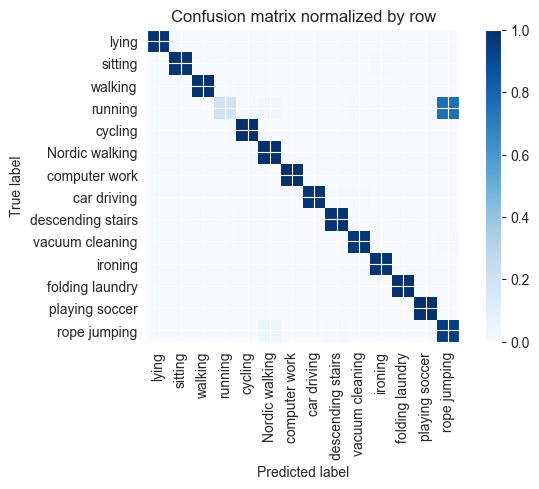

Training Epoch:  87%|████████▋ | 13/15 [09:24<01:29, 44.69s/it]

Overall accuracy: 0.951

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.997      0.994      0.145        602|	 ironing: 0.002,	sitting: 0.002,	
          walking       0.996      0.991      0.994      0.113        470|	 cycling: 0.006,	descending stairs: 0.002,	
          ironing       0.981      0.983      0.982      0.111        463|	 computer work: 0.006,	folding laundry: 0.004,	
            lying       1.000      0.984      0.992      0.089        372|	 sitting: 0.008,	vacuum cleaning: 0.003,	
          sitting       0.981      0.981      0.981      0.087        364|	 ironing: 0.011,	rope jumping: 0.003,	
   Nordic walking       0.970      0.992      0.981      0.086        358|	 rope jumping: 0.003,	cycling: 0.003,	
  vacuum cleaning       0.988      0.971      0.980      0.083        345|	 rope jumping: 0.009,	ironing: 0.009,	
          cycling       0.967      0.997      0.982      0.078        32


train: 100%|██████████| 261/261 [00:40<00:00,  6.49batch/s, loss=336, accuracy=0.938]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.49batch/s, loss=286]


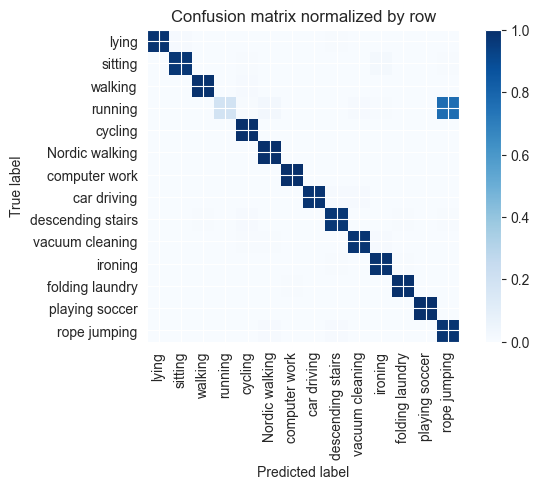

Training Epoch:  93%|█████████▎| 14/15 [10:10<00:44, 44.97s/it]

Overall accuracy: 0.951

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.997      0.997      0.145        602|	 ironing: 0.003,	rope jumping: 0.000,	
          walking       0.998      0.989      0.994      0.113        470|	 cycling: 0.009,	Nordic walking: 0.002,	
          ironing       0.974      0.987      0.981      0.111        463|	 folding laundry: 0.004,	descending stairs: 0.004,	
            lying       1.000      0.981      0.991      0.090        374|	 sitting: 0.008,	descending stairs: 0.005,	
          sitting       0.989      0.973      0.981      0.088        365|	 ironing: 0.016,	rope jumping: 0.005,	
   Nordic walking       0.973      0.997      0.985      0.086        357|	 rope jumping: 0.003,	playing soccer: 0.000,	
  vacuum cleaning       0.988      0.977      0.982      0.082        343|	 ironing: 0.009,	Nordic walking: 0.006,	
          cycling       0.967      0.997      0.982    


train: 100%|██████████| 261/261 [00:39<00:00,  6.58batch/s, loss=308, accuracy=0.969]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.29batch/s, loss=313]


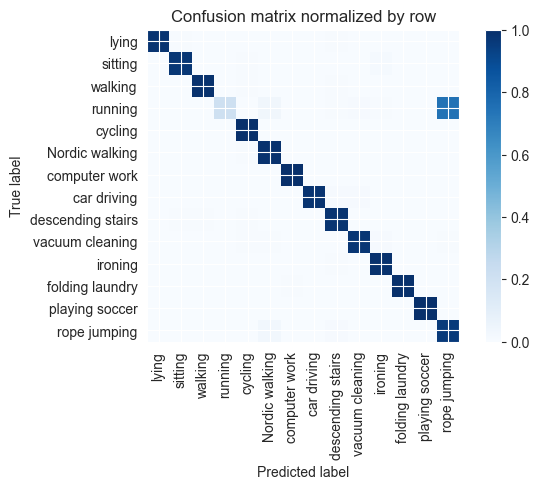

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.997      0.997      0.144        599|	 ironing: 0.002,	sitting: 0.002,	
          walking       0.996      0.989      0.993      0.113        471|	 cycling: 0.006,	descending stairs: 0.004,	
          ironing       0.979      0.989      0.984      0.112        465|	 descending stairs: 0.004,	computer work: 0.002,	
            lying       1.000      0.981      0.991      0.089        372|	 descending stairs: 0.005,	sitting: 0.005,	
          sitting       0.986      0.972      0.979      0.087        362|	 ironing: 0.014,	cycling: 0.006,	
   Nordic walking       0.967      0.992      0.979      0.086        358|	 cycling: 0.006,	rope jumping: 0.003,	
  vacuum cleaning       0.991      0.974      0.982      0.083        344|	 ironing: 0.009,	rope jumping: 0.006,	
          cycling       0.970      0.997      0.983      0.079        328

unseen: 100%|██████████| 87/87 [00:06<00:00, 13.10batch/s, loss=337]


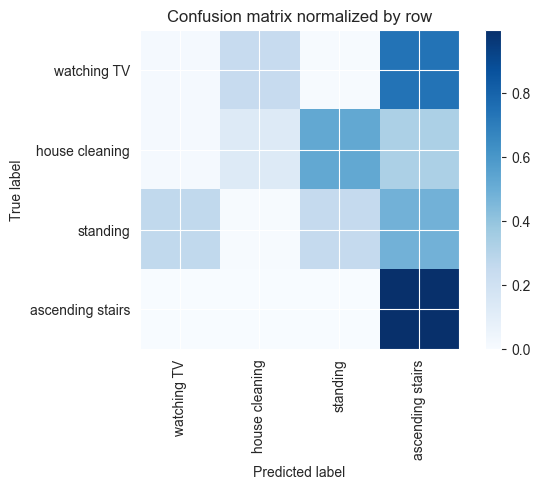

Overall accuracy: 0.320

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.323      0.250      0.282      0.331       1841|	 ascending stairs: 0.482,	watching TV: 0.263,	
  house cleaning       0.533      0.131      0.210      0.328       1828|	 standing: 0.526,	ascending stairs: 0.329,	
ascending stairs       0.338      0.998      0.506      0.193       1075|	 standing: 0.002,	house cleaning: 0.000,	
     watching TV       0.019      0.012      0.015      0.148        824|	 ascending stairs: 0.739,	house cleaning: 0.244,	

----------------------------------------------------------------------------------------------------
     avg / total       0.350      0.320      0.262        1.0       5568|	      

{'accuracy': 0.3202227011494253, 'precision': 0.3034885417622033, 'recall': 0.347856706749466, 'f1': 0.25311394467009896}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumping', 'sitting', '

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 1024])



train: 100%|██████████| 262/262 [00:40<00:00,  6.54batch/s, loss=322, accuracy=0.812]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.18batch/s, loss=328]


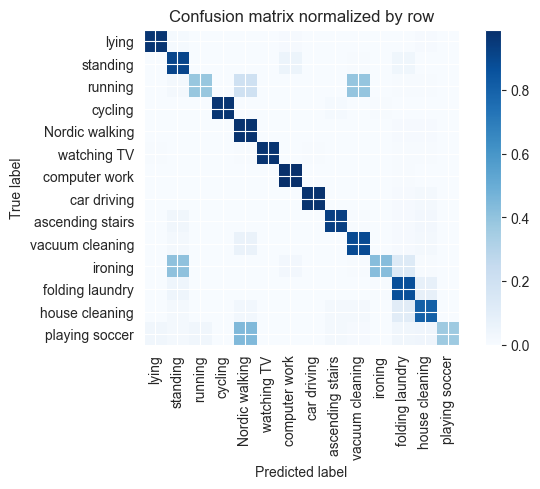

Training Epoch:   7%|▋         | 1/15 [00:45<10:36, 45.48s/it]

Overall accuracy: 0.838

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.944      0.987      0.965      0.149        618|	 folding laundry: 0.005,	ironing: 0.003,	
         ironing       0.975      0.425      0.592      0.111        463|	 standing: 0.408,	folding laundry: 0.127,	
           lying       0.989      0.966      0.978      0.092        384|	 standing: 0.013,	house cleaning: 0.008,	
        standing       0.594      0.905      0.717      0.089        370|	 computer work: 0.051,	folding laundry: 0.038,	
  Nordic walking       0.754      0.975      0.850      0.087        364|	 house cleaning: 0.011,	folding laundry: 0.008,	
  house cleaning       0.861      0.803      0.831      0.086        356|	 folding laundry: 0.110,	Nordic walking: 0.028,	
 vacuum cleaning       0.784      0.886      0.832      0.085        352|	 Nordic walking: 0.065,	house cleaning: 0.017,	
         cycling       0.993      0.967     


train: 100%|██████████| 262/262 [00:42<00:00,  6.12batch/s, loss=309, accuracy=0.859]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.39batch/s, loss=307]


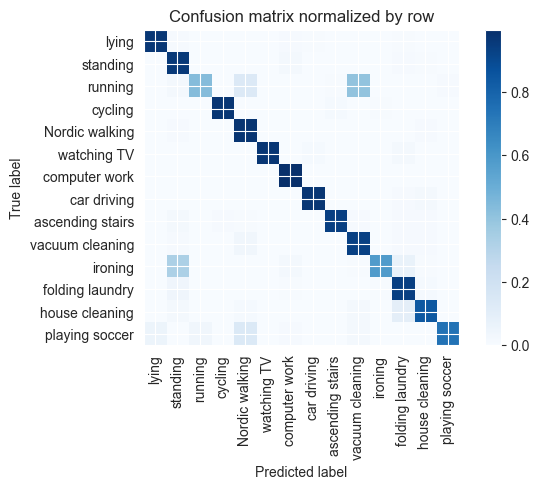

Training Epoch:  13%|█▎        | 2/15 [01:33<10:11, 47.04s/it]

Overall accuracy: 0.883

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.967      0.997      0.982      0.148        614|	 house cleaning: 0.002,	folding laundry: 0.002,	
         ironing       0.989      0.576      0.728      0.112        465|	 standing: 0.329,	folding laundry: 0.067,	
           lying       0.987      0.969      0.978      0.092        382|	 standing: 0.010,	computer work: 0.008,	
        standing       0.656      0.960      0.779      0.089        371|	 computer work: 0.022,	folding laundry: 0.011,	
  Nordic walking       0.862      0.975      0.915      0.088        366|	 standing: 0.011,	house cleaning: 0.008,	
  house cleaning       0.941      0.844      0.890      0.086        359|	 folding laundry: 0.095,	standing: 0.022,	
 vacuum cleaning       0.781      0.934      0.851      0.084        348|	 Nordic walking: 0.034,	folding laundry: 0.011,	
         cycling       0.990      0.970      0.980


train: 100%|██████████| 262/262 [00:40<00:00,  6.43batch/s, loss=343, accuracy=0.891]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.45batch/s, loss=316]


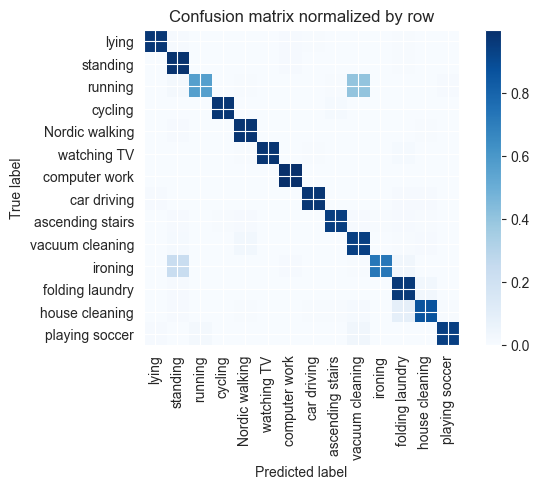

Training Epoch:  20%|██        | 3/15 [02:19<09:19, 46.59s/it]

Overall accuracy: 0.916

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.982      0.998      0.990      0.148        615|	 house cleaning: 0.002,	playing soccer: 0.000,	
         ironing       0.994      0.722      0.836      0.112        464|	 standing: 0.231,	folding laundry: 0.032,	
           lying       0.995      0.969      0.981      0.092        381|	 standing: 0.010,	computer work: 0.008,	
  Nordic walking       0.952      0.978      0.965      0.088        367|	 standing: 0.011,	house cleaning: 0.005,	
        standing       0.733      0.984      0.840      0.088        366|	 computer work: 0.008,	folding laundry: 0.005,	
  house cleaning       0.950      0.862      0.904      0.085        355|	 folding laundry: 0.087,	vacuum cleaning: 0.014,	
 vacuum cleaning       0.786      0.938      0.855      0.085        353|	 Nordic walking: 0.031,	standing: 0.014,	
         cycling       0.993      0.974      0.983 


train: 100%|██████████| 262/262 [00:40<00:00,  6.44batch/s, loss=320, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.83batch/s, loss=329]


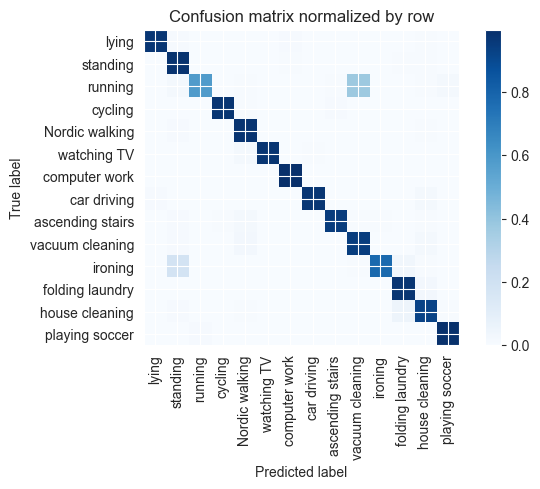

Training Epoch:  27%|██▋       | 4/15 [03:05<08:31, 46.46s/it]

Overall accuracy: 0.931

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.990      0.997      0.994      0.148        616|	 playing soccer: 0.002,	house cleaning: 0.002,	
         ironing       0.994      0.776      0.872      0.112        465|	 standing: 0.181,	folding laundry: 0.032,	
           lying       0.997      0.971      0.984      0.091        377|	 standing: 0.011,	computer work: 0.008,	
        standing       0.780      0.984      0.870      0.089        371|	 house cleaning: 0.005,	folding laundry: 0.005,	
  Nordic walking       0.945      0.978      0.961      0.088        367|	 standing: 0.008,	house cleaning: 0.005,	
  house cleaning       0.932      0.925      0.928      0.086        358|	 folding laundry: 0.047,	standing: 0.008,	
 vacuum cleaning       0.811      0.946      0.873      0.084        349|	 Nordic walking: 0.026,	house cleaning: 0.017,	
         cycling       0.993      0.974      0.983 


train: 100%|██████████| 262/262 [00:40<00:00,  6.41batch/s, loss=332, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.10batch/s, loss=319]


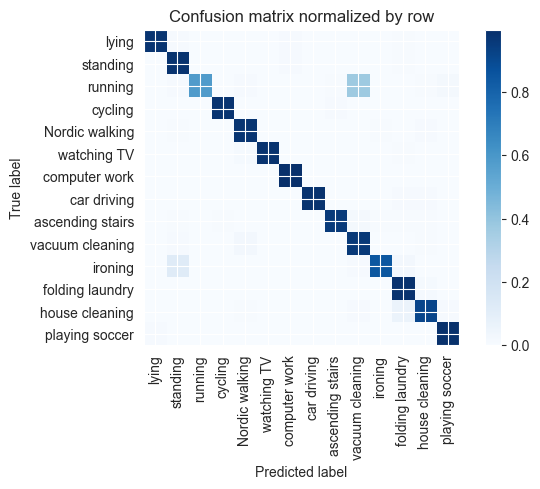

Training Epoch:  33%|███▎      | 5/15 [03:52<07:44, 46.42s/it]

Overall accuracy: 0.940

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.989      0.995      0.992      0.148        615|	 playing soccer: 0.003,	house cleaning: 0.002,	
         ironing       0.990      0.844      0.911      0.111        463|	 standing: 0.119,	folding laundry: 0.026,	
           lying       0.997      0.976      0.987      0.092        381|	 computer work: 0.008,	standing: 0.008,	
        standing       0.844      0.981      0.908      0.090        375|	 computer work: 0.008,	folding laundry: 0.005,	
  Nordic walking       0.955      0.975      0.965      0.088        366|	 house cleaning: 0.008,	ironing: 0.005,	
  house cleaning       0.961      0.910      0.935      0.085        355|	 folding laundry: 0.059,	playing soccer: 0.008,	
 vacuum cleaning       0.805      0.958      0.875      0.085        353|	 Nordic walking: 0.025,	standing: 0.008,	
         cycling       0.993      0.977      0.985   


train: 100%|██████████| 262/262 [00:40<00:00,  6.43batch/s, loss=301, accuracy=0.938]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.67batch/s, loss=311]


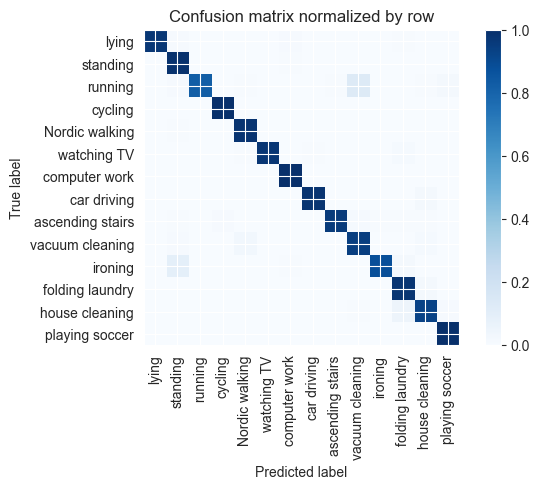

Training Epoch:  40%|████      | 6/15 [04:38<06:57, 46.40s/it]

Overall accuracy: 0.957

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.987      0.997      0.992      0.149        619|	 playing soccer: 0.002,	lying: 0.002,	
         ironing       0.993      0.881      0.933      0.111        461|	 standing: 0.091,	folding laundry: 0.020,	
           lying       0.995      0.971      0.983      0.092        384|	 standing: 0.010,	computer work: 0.008,	
        standing       0.873      0.992      0.929      0.090        375|	 computer work: 0.005,	folding laundry: 0.003,	
  Nordic walking       0.962      0.981      0.971      0.087        364|	 standing: 0.005,	house cleaning: 0.003,	
  house cleaning       0.953      0.927      0.940      0.085        354|	 folding laundry: 0.048,	playing soccer: 0.011,	
 vacuum cleaning       0.915      0.943      0.929      0.085        353|	 Nordic walking: 0.031,	house cleaning: 0.014,	
         cycling       0.990      0.997      0.993     


train: 100%|██████████| 262/262 [00:40<00:00,  6.39batch/s, loss=321, accuracy=0.984]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.15batch/s, loss=310]


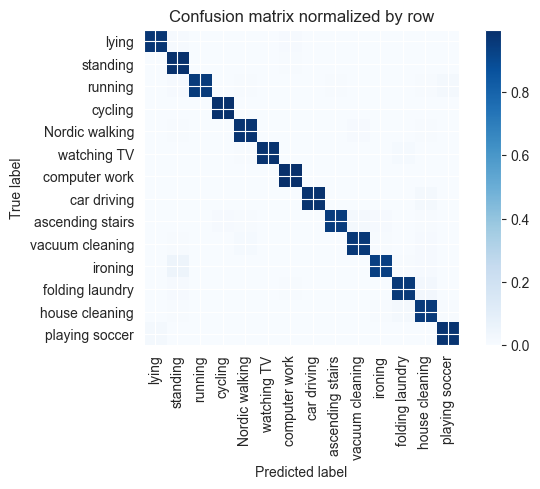

Training Epoch:  47%|████▋     | 7/15 [05:25<06:11, 46.41s/it]

Overall accuracy: 0.971

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.989      0.997      0.993      0.148        615|	 playing soccer: 0.002,	lying: 0.002,	
         ironing       0.982      0.937      0.959      0.111        463|	 standing: 0.048,	house cleaning: 0.009,	
           lying       0.992      0.971      0.981      0.092        382|	 standing: 0.010,	computer work: 0.008,	
        standing       0.911      0.989      0.948      0.089        372|	 computer work: 0.005,	folding laundry: 0.003,	
  Nordic walking       0.973      0.978      0.975      0.088        366|	 vacuum cleaning: 0.008,	house cleaning: 0.005,	
  house cleaning       0.945      0.955      0.950      0.086        357|	 folding laundry: 0.020,	playing soccer: 0.006,	
 vacuum cleaning       0.974      0.963      0.968      0.084        351|	 Nordic walking: 0.014,	house cleaning: 0.011,	
         cycling       0.990      0.990      0.99


train: 100%|██████████| 262/262 [00:41<00:00,  6.35batch/s, loss=331, accuracy=0.891]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.01batch/s, loss=308]


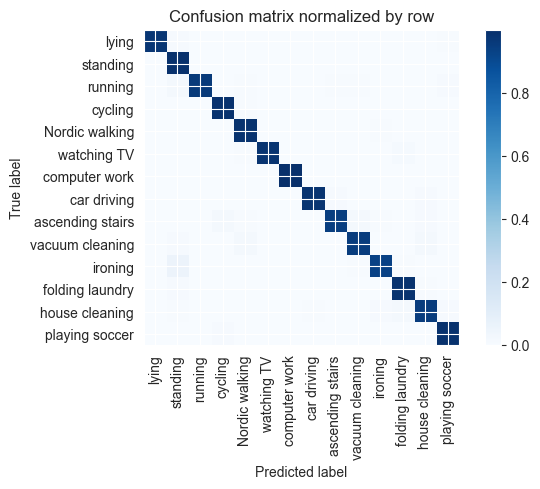

Training Epoch:  53%|█████▎    | 8/15 [06:11<05:25, 46.52s/it]

Overall accuracy: 0.971

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.998      0.998      0.149        619|	 lying: 0.002,	playing soccer: 0.000,	
         ironing       0.982      0.929      0.954      0.111        463|	 standing: 0.056,	folding laundry: 0.006,	
           lying       0.997      0.974      0.985      0.092        381|	 standing: 0.010,	playing soccer: 0.005,	
        standing       0.897      0.992      0.942      0.089        369|	 folding laundry: 0.003,	ironing: 0.003,	
  Nordic walking       0.963      0.984      0.973      0.088        366|	 ironing: 0.005,	house cleaning: 0.003,	
  house cleaning       0.963      0.949      0.956      0.085        354|	 folding laundry: 0.017,	playing soccer: 0.008,	
 vacuum cleaning       0.971      0.949      0.960      0.085        354|	 Nordic walking: 0.023,	house cleaning: 0.017,	
         cycling       0.983      0.990      0.987      0.072


train: 100%|██████████| 262/262 [00:41<00:00,  6.32batch/s, loss=316, accuracy=0.984]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.01batch/s, loss=317]


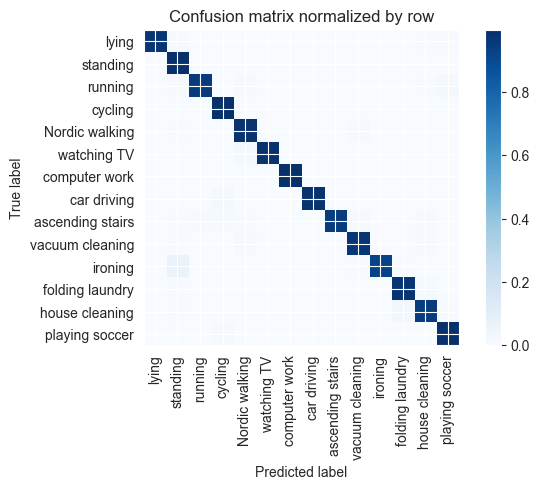

Training Epoch:  60%|██████    | 9/15 [06:58<04:40, 46.67s/it]

Overall accuracy: 0.972

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.997      0.997      0.149        618|	 playing soccer: 0.002,	lying: 0.002,	
         ironing       0.998      0.923      0.959      0.112        466|	 standing: 0.064,	vacuum cleaning: 0.006,	
           lying       0.997      0.971      0.984      0.092        381|	 standing: 0.010,	playing soccer: 0.005,	
        standing       0.892      0.995      0.940      0.090        373|	 house cleaning: 0.003,	computer work: 0.003,	
  Nordic walking       0.970      0.984      0.977      0.088        367|	 vacuum cleaning: 0.008,	standing: 0.005,	
  house cleaning       0.957      0.949      0.953      0.085        354|	 folding laundry: 0.031,	playing soccer: 0.006,	
 vacuum cleaning       0.974      0.972      0.973      0.085        353|	 house cleaning: 0.011,	Nordic walking: 0.011,	
         cycling       0.980      0.997      0.988    


train: 100%|██████████| 262/262 [00:41<00:00,  6.38batch/s, loss=309, accuracy=0.969]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.95batch/s, loss=334]


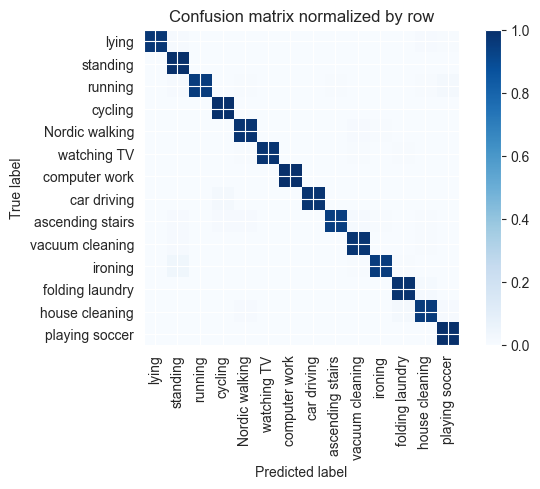

Training Epoch:  67%|██████▋   | 10/15 [07:45<03:53, 46.64s/it]

Overall accuracy: 0.977

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.998      0.998      0.148        617|	 lying: 0.002,	playing soccer: 0.000,	
         ironing       0.991      0.953      0.971      0.112        464|	 standing: 0.037,	folding laundry: 0.004,	
           lying       0.997      0.971      0.984      0.092        381|	 standing: 0.010,	house cleaning: 0.008,	
        standing       0.926      0.997      0.960      0.090        375|	 folding laundry: 0.003,	playing soccer: 0.000,	
  Nordic walking       0.978      0.981      0.979      0.088        365|	 vacuum cleaning: 0.011,	ironing: 0.005,	
  house cleaning       0.966      0.955      0.961      0.086        358|	 folding laundry: 0.017,	playing soccer: 0.011,	
 vacuum cleaning       0.969      0.980      0.974      0.084        350|	 standing: 0.009,	house cleaning: 0.006,	
         cycling       0.980      0.997      0.988      0.0


train: 100%|██████████| 262/262 [00:41<00:00,  6.26batch/s, loss=298, accuracy=1]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.88batch/s, loss=314]


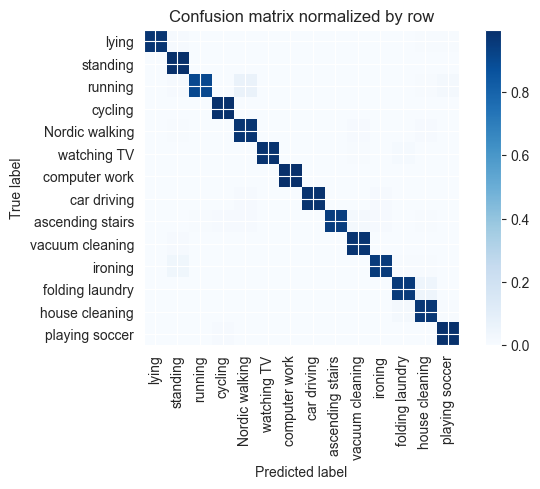

Training Epoch:  73%|███████▎  | 11/15 [08:32<03:07, 46.86s/it]

Overall accuracy: 0.973

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.997      0.997      0.148        617|	 playing soccer: 0.002,	lying: 0.002,	
         ironing       0.989      0.950      0.969      0.112        464|	 standing: 0.039,	house cleaning: 0.004,	
           lying       0.997      0.973      0.985      0.091        377|	 standing: 0.011,	playing soccer: 0.005,	
        standing       0.923      0.995      0.957      0.089        372|	 folding laundry: 0.003,	computer work: 0.003,	
  Nordic walking       0.955      0.976      0.965      0.088        368|	 house cleaning: 0.008,	vacuum cleaning: 0.008,	
  house cleaning       0.948      0.969      0.958      0.085        355|	 folding laundry: 0.020,	playing soccer: 0.006,	
 vacuum cleaning       0.972      0.977      0.975      0.085        353|	 standing: 0.008,	house cleaning: 0.003,	
         cycling       0.987      0.990      0.988    


train: 100%|██████████| 262/262 [00:41<00:00,  6.35batch/s, loss=303, accuracy=1]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.06batch/s, loss=312]


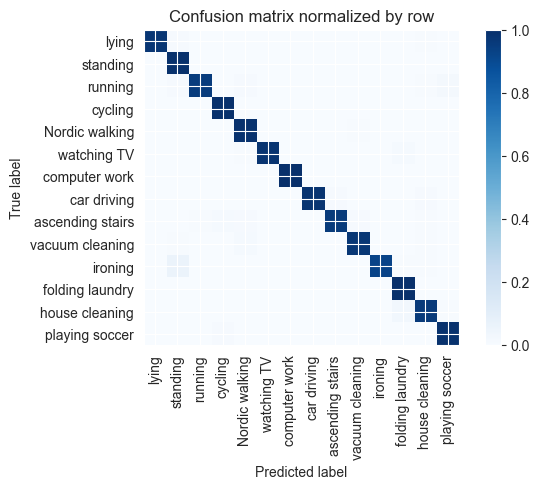

Training Epoch:  80%|████████  | 12/15 [09:19<02:20, 46.81s/it]

Overall accuracy: 0.975

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.997      0.997      0.148        615|	 playing soccer: 0.002,	lying: 0.002,	
         ironing       0.998      0.925      0.960      0.112        466|	 standing: 0.060,	house cleaning: 0.006,	
           lying       0.997      0.976      0.987      0.091        380|	 standing: 0.011,	house cleaning: 0.005,	
        standing       0.909      0.995      0.950      0.090        373|	 folding laundry: 0.003,	computer work: 0.003,	
  Nordic walking       0.968      0.989      0.978      0.088        366|	 vacuum cleaning: 0.005,	house cleaning: 0.003,	
  house cleaning       0.969      0.958      0.963      0.085        354|	 folding laundry: 0.031,	playing soccer: 0.006,	
 vacuum cleaning       0.983      0.972      0.977      0.085        353|	 Nordic walking: 0.014,	house cleaning: 0.006,	
         cycling       0.987      0.993      0.9


train: 100%|██████████| 262/262 [00:41<00:00,  6.30batch/s, loss=317, accuracy=0.984]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.05batch/s, loss=300]


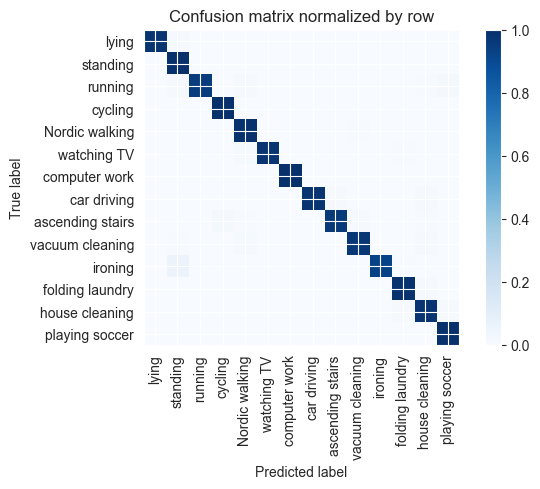

Training Epoch:  87%|████████▋ | 13/15 [10:06<01:33, 46.88s/it]

Overall accuracy: 0.978

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.998      0.998      0.149        619|	 lying: 0.002,	playing soccer: 0.000,	
         ironing       1.000      0.929      0.963      0.111        463|	 standing: 0.058,	folding laundry: 0.006,	
           lying       0.997      0.979      0.988      0.091        379|	 standing: 0.011,	car driving: 0.003,	
        standing       0.910      0.997      0.952      0.090        375|	 computer work: 0.003,	playing soccer: 0.000,	
  Nordic walking       0.968      0.989      0.978      0.088        368|	 vacuum cleaning: 0.005,	running: 0.003,	
  house cleaning       0.972      0.977      0.975      0.085        353|	 playing soccer: 0.008,	folding laundry: 0.008,	
 vacuum cleaning       0.983      0.969      0.976      0.085        353|	 Nordic walking: 0.014,	house cleaning: 0.011,	
         cycling       0.984      1.000      0.992      0.


train: 100%|██████████| 262/262 [00:41<00:00,  6.32batch/s, loss=320, accuracy=0.969]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.05batch/s, loss=323]


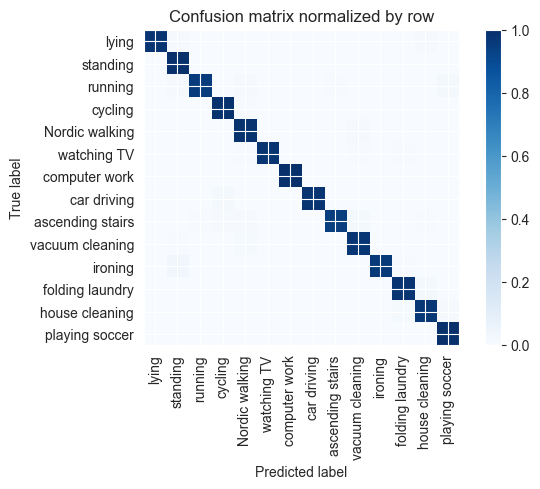

Training Epoch:  93%|█████████▎| 14/15 [10:53<00:46, 46.89s/it]

Overall accuracy: 0.980

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.998      0.997      0.998      0.149        618|	 playing soccer: 0.002,	lying: 0.002,	
         ironing       0.993      0.959      0.976      0.112        464|	 standing: 0.032,	folding laundry: 0.006,	
           lying       0.997      0.979      0.988      0.092        383|	 standing: 0.010,	house cleaning: 0.008,	
        standing       0.939      0.995      0.966      0.090        374|	 house cleaning: 0.003,	ironing: 0.003,	
  Nordic walking       0.962      0.986      0.974      0.087        364|	 vacuum cleaning: 0.011,	ironing: 0.003,	
  house cleaning       0.972      0.972      0.972      0.085        355|	 folding laundry: 0.014,	playing soccer: 0.008,	
 vacuum cleaning       0.972      0.975      0.973      0.085        354|	 Nordic walking: 0.014,	standing: 0.006,	
         cycling       0.987      0.990      0.988      0.072      


train: 100%|██████████| 262/262 [00:41<00:00,  6.32batch/s, loss=307, accuracy=0.984]


torch.Size([14, 1024])



seen: 100%|██████████| 65/65 [00:05<00:00, 12.83batch/s, loss=290]


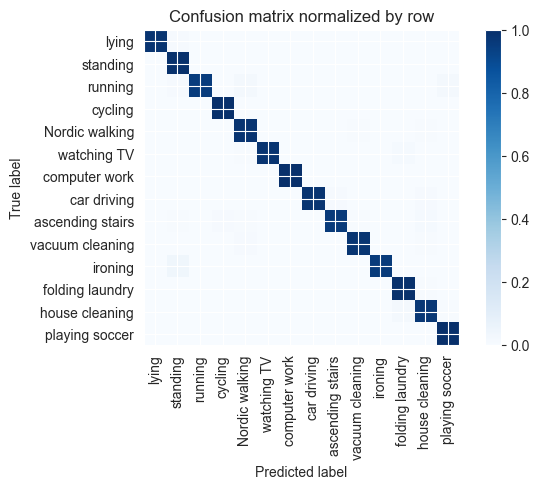

Overall accuracy: 0.981

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.997      0.998      0.998      0.146        607|	 lying: 0.002,	playing soccer: 0.000,	
         ironing       0.991      0.957      0.974      0.112        464|	 standing: 0.039,	house cleaning: 0.002,	
           lying       0.997      0.982      0.989      0.092        382|	 standing: 0.010,	house cleaning: 0.003,	
        standing       0.932      0.995      0.962      0.089        371|	 folding laundry: 0.003,	computer work: 0.003,	
  Nordic walking       0.978      0.984      0.981      0.088        368|	 house cleaning: 0.005,	vacuum cleaning: 0.005,	
  house cleaning       0.969      0.972      0.971      0.086        357|	 folding laundry: 0.020,	playing soccer: 0.006,	
 vacuum cleaning       0.991      0.977      0.984      0.085        354|	 Nordic walking: 0.008,	house cleaning: 0.006,	
         cycling       0.993      0.997      0.9

unseen: 100%|██████████| 86/86 [00:06<00:00, 13.98batch/s, loss=360]


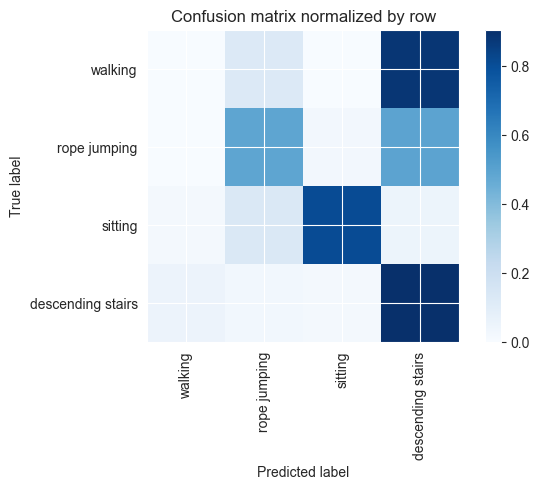

Overall accuracy: 0.456

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.000      0.000      0.000      0.422       2320|	 descending stairs: 0.880,	rope jumping: 0.120,	sitting: 0.000,	
          sitting       0.983      0.806      0.886      0.324       1786|	 rope jumping: 0.129,	descending stairs: 0.049,	
descending stairs       0.266      0.904      0.411      0.171        941|	 walking: 0.052,	rope jumping: 0.028,	
     rope jumping       0.293      0.486      0.365      0.083        457|	 descending stairs: 0.492,	sitting: 0.022,	

----------------------------------------------------------------------------------------------------
      avg / total       0.389      0.456      0.388        1.0       5504|	      

{'accuracy': 0.4563953488372093, 'precision': 0.38533052690462655, 'recall': 0.5489612396069745, 'f1': 0.41537168011456477}
================ Fold-2 ================
Unseen Classes : ['playing soccer',

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 1024])



train: 100%|██████████| 242/242 [00:37<00:00,  6.45batch/s, loss=303, accuracy=0.875]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 13.04batch/s, loss=312]


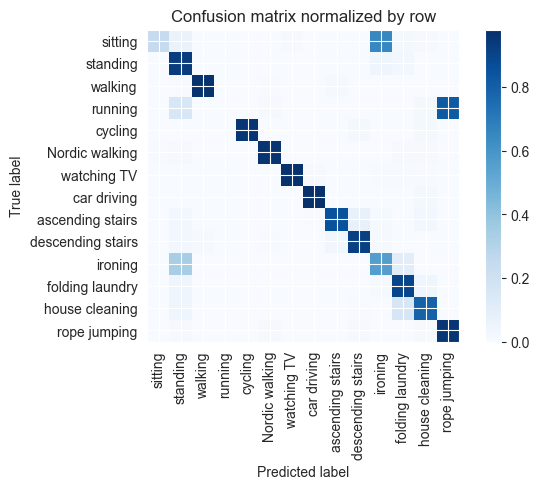

Training Epoch:   7%|▋         | 1/15 [00:42<09:56, 42.62s/it]

Overall accuracy: 0.772

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.994      0.972      0.983      0.123        472|	 ascending stairs: 0.015,	Nordic walking: 0.006,	
          ironing       0.488      0.558      0.520      0.120        459|	 standing: 0.338,	folding laundry: 0.102,	
         standing       0.586      0.933      0.720      0.097        373|	 ironing: 0.043,	folding laundry: 0.024,	
          sitting       0.957      0.242      0.386      0.097        372|	 ironing: 0.653,	standing: 0.065,	
   Nordic walking       0.980      0.960      0.970      0.092        353|	 standing: 0.011,	house cleaning: 0.008,	
   house cleaning       0.882      0.789      0.833      0.089        342|	 folding laundry: 0.155,	standing: 0.041,	
          cycling       1.000      0.956      0.977      0.082        315|	 house cleaning: 0.019,	descending stairs: 0.019,	
 ascending stairs       0.928      0.858      0.892


train: 100%|██████████| 242/242 [00:38<00:00,  6.28batch/s, loss=336, accuracy=0.844]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.95batch/s, loss=315]


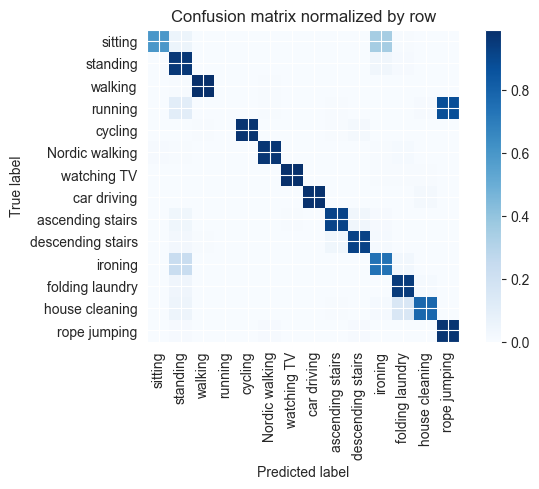

Training Epoch:  13%|█▎        | 2/15 [01:26<09:21, 43.21s/it]

Overall accuracy: 0.839

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.994      0.989      0.992      0.123        472|	 Nordic walking: 0.004,	standing: 0.004,	
          ironing       0.693      0.738      0.715      0.120        462|	 standing: 0.232,	folding laundry: 0.028,	
         standing       0.659      0.958      0.781      0.098        378|	 ironing: 0.032,	folding laundry: 0.011,	
          sitting       0.982      0.592      0.739      0.096        368|	 ironing: 0.345,	standing: 0.052,	
   Nordic walking       0.989      0.964      0.976      0.093        357|	 folding laundry: 0.014,	sitting: 0.008,	
   house cleaning       0.960      0.780      0.861      0.089        341|	 folding laundry: 0.150,	standing: 0.050,	
          cycling       1.000      0.971      0.985      0.081        312|	 descending stairs: 0.016,	ascending stairs: 0.006,	
 ascending stairs       0.936      0.914      0.925      


train: 100%|██████████| 242/242 [00:38<00:00,  6.35batch/s, loss=293, accuracy=0.844]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.85batch/s, loss=297]


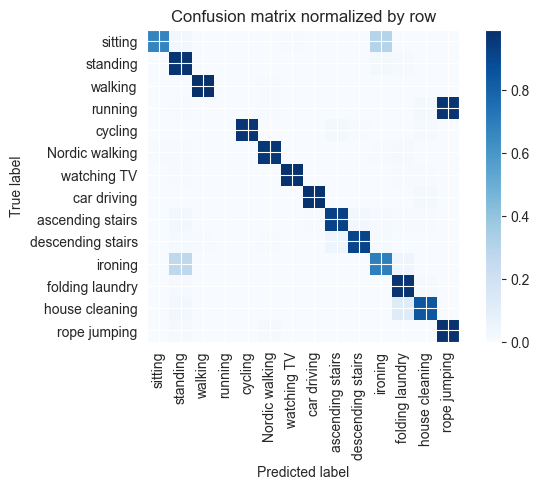

Training Epoch:  20%|██        | 3/15 [02:09<08:39, 43.28s/it]

Overall accuracy: 0.850

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.996      0.992      0.994      0.123        474|	 Nordic walking: 0.004,	ascending stairs: 0.002,	
          ironing       0.720      0.689      0.704      0.121        463|	 standing: 0.270,	folding laundry: 0.039,	
         standing       0.695      0.973      0.811      0.097        374|	 ironing: 0.019,	folding laundry: 0.008,	
          sitting       0.988      0.668      0.797      0.095        365|	 ironing: 0.299,	standing: 0.025,	
   Nordic walking       0.986      0.964      0.975      0.093        357|	 folding laundry: 0.011,	ironing: 0.006,	
   house cleaning       0.947      0.844      0.892      0.088        339|	 folding laundry: 0.118,	standing: 0.029,	
          cycling       1.000      0.965      0.982      0.082        316|	 ascending stairs: 0.016,	house cleaning: 0.009,	
 ascending stairs       0.922      0.922      0.922 


train: 100%|██████████| 242/242 [00:38<00:00,  6.32batch/s, loss=305, accuracy=0.938]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.90batch/s, loss=305]


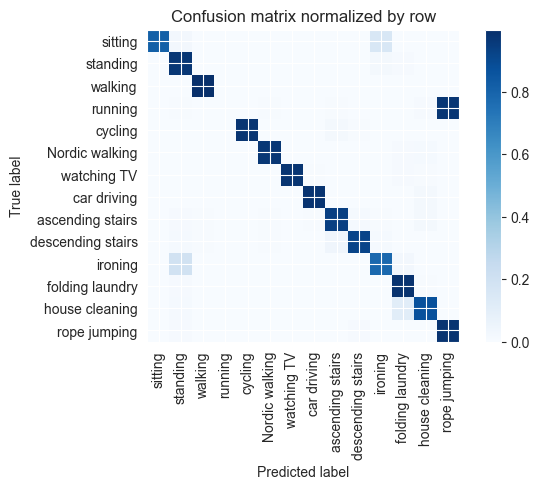

Training Epoch:  27%|██▋       | 4/15 [02:53<07:56, 43.34s/it]

Overall accuracy: 0.880

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.996      0.998      0.997      0.122        468|	 standing: 0.002,	rope jumping: 0.000,	
          ironing       0.838      0.781      0.808      0.121        465|	 standing: 0.191,	folding laundry: 0.026,	
         standing       0.760      0.968      0.851      0.097        373|	 ironing: 0.021,	folding laundry: 0.008,	
          sitting       0.990      0.812      0.893      0.096        368|	 ironing: 0.155,	standing: 0.027,	
   Nordic walking       0.991      0.969      0.980      0.092        353|	 house cleaning: 0.014,	folding laundry: 0.008,	
   house cleaning       0.946      0.871      0.907      0.089        341|	 folding laundry: 0.109,	standing: 0.015,	
          cycling       0.997      0.975      0.986      0.082        316|	 ascending stairs: 0.019,	descending stairs: 0.006,	
 ascending stairs       0.925      0.938      0.931 


train: 100%|██████████| 242/242 [00:38<00:00,  6.32batch/s, loss=333, accuracy=0.859]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 13.04batch/s, loss=331]


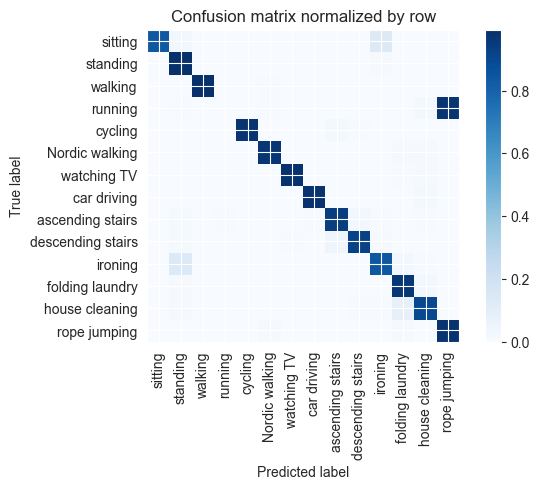

Training Epoch:  33%|███▎      | 5/15 [03:36<07:13, 43.35s/it]

Overall accuracy: 0.893

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.994      0.996      0.122        468|	 Nordic walking: 0.004,	standing: 0.002,	
          ironing       0.872      0.838      0.855      0.121        464|	 standing: 0.134,	folding laundry: 0.024,	
         standing       0.813      0.989      0.893      0.099        379|	 ironing: 0.008,	house cleaning: 0.003,	
          sitting       0.994      0.838      0.909      0.097        371|	 ironing: 0.129,	standing: 0.027,	
   Nordic walking       0.989      0.969      0.979      0.093        356|	 house cleaning: 0.008,	folding laundry: 0.008,	
   house cleaning       0.938      0.897      0.917      0.089        340|	 folding laundry: 0.079,	standing: 0.009,	
          cycling       0.997      0.974      0.985      0.082        313|	 ascending stairs: 0.016,	descending stairs: 0.006,	
 ascending stairs       0.933      0.942      0.938


train: 100%|██████████| 242/242 [00:38<00:00,  6.30batch/s, loss=307, accuracy=0.891]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.78batch/s, loss=289]


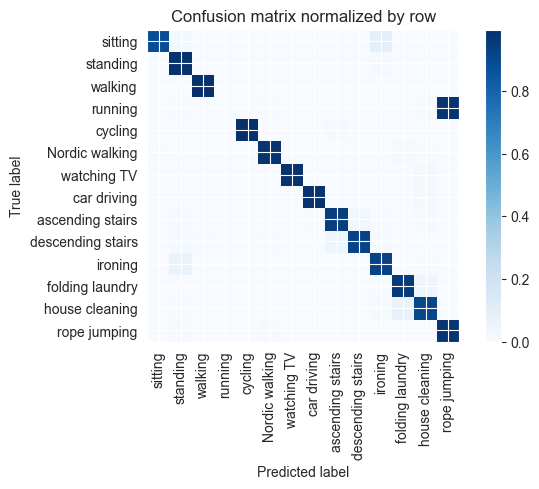

Training Epoch:  40%|████      | 6/15 [04:20<06:30, 43.44s/it]

Overall accuracy: 0.910

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.996      0.997      0.121        466|	 ascending stairs: 0.002,	standing: 0.002,	
          ironing       0.901      0.929      0.915      0.120        462|	 standing: 0.065,	house cleaning: 0.004,	
         standing       0.888      0.987      0.935      0.098        376|	 ironing: 0.008,	folding laundry: 0.003,	
          sitting       0.988      0.886      0.934      0.096        369|	 ironing: 0.092,	standing: 0.016,	
   Nordic walking       0.991      0.975      0.983      0.093        356|	 folding laundry: 0.008,	house cleaning: 0.006,	
   house cleaning       0.931      0.909      0.920      0.089        341|	 folding laundry: 0.067,	ironing: 0.015,	
          cycling       0.997      0.990      0.994      0.082        313|	 ascending stairs: 0.010,	rope jumping: 0.000,	
 ascending stairs       0.943      0.943      0.943    


train: 100%|██████████| 242/242 [00:38<00:00,  6.33batch/s, loss=303, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.88batch/s, loss=336]


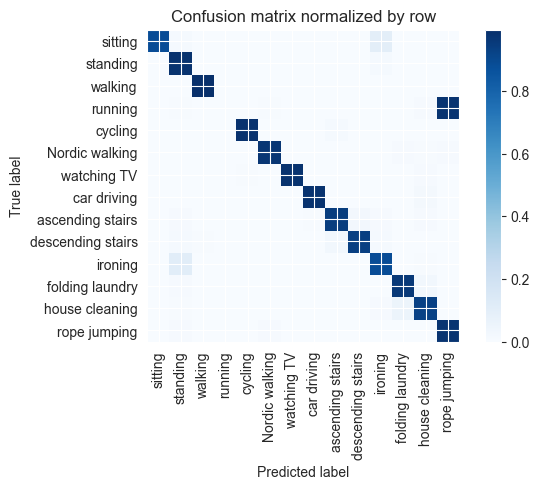

Training Epoch:  47%|████▋     | 7/15 [05:03<05:47, 43.41s/it]

Overall accuracy: 0.906

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.996      0.997      0.122        468|	 ascending stairs: 0.002,	standing: 0.002,	
          ironing       0.890      0.886      0.888      0.121        464|	 standing: 0.108,	house cleaning: 0.004,	
         standing       0.846      0.984      0.910      0.097        373|	 ironing: 0.013,	sitting: 0.003,	
          sitting       0.994      0.883      0.935      0.096        368|	 ironing: 0.101,	standing: 0.014,	
   Nordic walking       0.994      0.972      0.983      0.093        357|	 rope jumping: 0.008,	folding laundry: 0.008,	
   house cleaning       0.943      0.929      0.936      0.088        339|	 folding laundry: 0.053,	ironing: 0.009,	
          cycling       0.994      0.984      0.989      0.082        315|	 ascending stairs: 0.013,	descending stairs: 0.003,	
 ascending stairs       0.947      0.943      0.945      0.0


train: 100%|██████████| 242/242 [00:38<00:00,  6.25batch/s, loss=300, accuracy=0.922]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 13.03batch/s, loss=301]


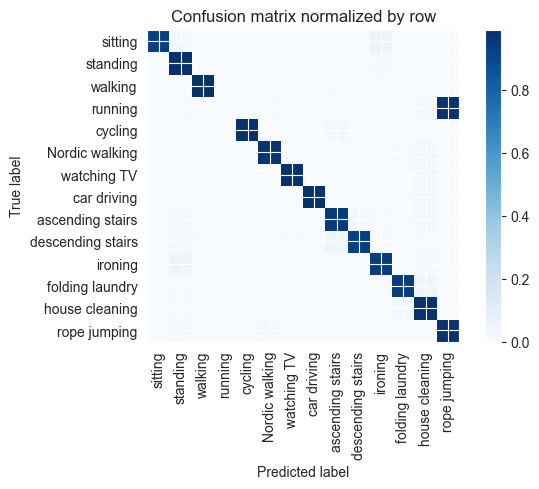

Training Epoch:  53%|█████▎    | 8/15 [05:47<05:04, 43.53s/it]

Overall accuracy: 0.921

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.992      0.995      0.123        472|	 ascending stairs: 0.006,	standing: 0.002,	
          ironing       0.941      0.939      0.940      0.120        461|	 standing: 0.050,	house cleaning: 0.009,	
         standing       0.905      0.984      0.943      0.098        376|	 ironing: 0.011,	folding laundry: 0.003,	
          sitting       0.997      0.930      0.962      0.097        372|	 ironing: 0.051,	standing: 0.016,	
   Nordic walking       0.994      0.972      0.983      0.093        356|	 house cleaning: 0.017,	folding laundry: 0.006,	
   house cleaning       0.913      0.977      0.944      0.089        342|	 folding laundry: 0.018,	standing: 0.006,	
          cycling       0.997      0.981      0.989      0.081        311|	 ascending stairs: 0.016,	descending stairs: 0.003,	
 ascending stairs       0.925      0.947      0.9


train: 100%|██████████| 242/242 [00:38<00:00,  6.29batch/s, loss=302, accuracy=0.875]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.94batch/s, loss=309]


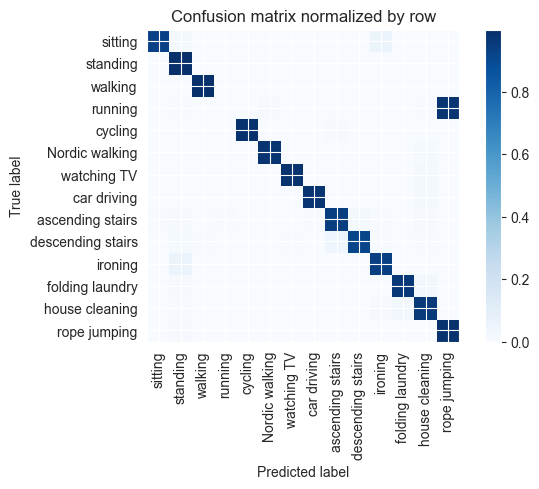

Training Epoch:  60%|██████    | 9/15 [06:30<04:21, 43.56s/it]

Overall accuracy: 0.922

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.998      0.998      0.123        472|	 standing: 0.002,	rope jumping: 0.000,	
          ironing       0.946      0.938      0.942      0.121        465|	 standing: 0.060,	house cleaning: 0.002,	
         standing       0.890      0.995      0.939      0.097        374|	 ironing: 0.003,	sitting: 0.003,	
          sitting       0.994      0.930      0.961      0.096        369|	 ironing: 0.051,	standing: 0.016,	
   Nordic walking       0.991      0.978      0.984      0.093        356|	 house cleaning: 0.014,	rope jumping: 0.003,	
   house cleaning       0.939      0.956      0.948      0.089        340|	 folding laundry: 0.029,	ironing: 0.009,	
          cycling       0.997      0.987      0.992      0.082        314|	 ascending stairs: 0.010,	Nordic walking: 0.003,	
 ascending stairs       0.938      0.942      0.940      0.054      


train: 100%|██████████| 242/242 [00:38<00:00,  6.25batch/s, loss=304, accuracy=0.875]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.97batch/s, loss=278]


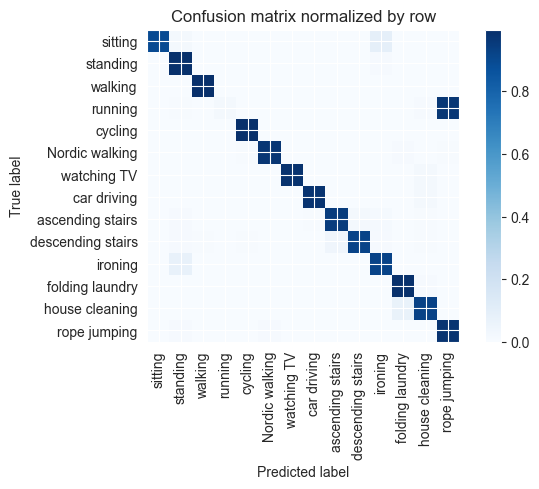

Training Epoch:  67%|██████▋   | 10/15 [07:14<03:38, 43.63s/it]

Overall accuracy: 0.915

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.996      0.997      0.123        471|	 ascending stairs: 0.002,	standing: 0.002,	
          ironing       0.912      0.922      0.917      0.120        459|	 standing: 0.076,	house cleaning: 0.002,	
         standing       0.884      0.992      0.935      0.098        376|	 ironing: 0.008,	rope jumping: 0.000,	
          sitting       0.997      0.895      0.943      0.097        371|	 ironing: 0.086,	standing: 0.016,	
   Nordic walking       0.997      0.972      0.984      0.093        357|	 folding laundry: 0.008,	rope jumping: 0.006,	
   house cleaning       0.957      0.926      0.942      0.089        340|	 folding laundry: 0.068,	ironing: 0.003,	
          cycling       0.990      0.997      0.994      0.082        313|	 ascending stairs: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.947      0.947      0.947      0.0


train: 100%|██████████| 242/242 [00:38<00:00,  6.30batch/s, loss=297, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.98batch/s, loss=316]


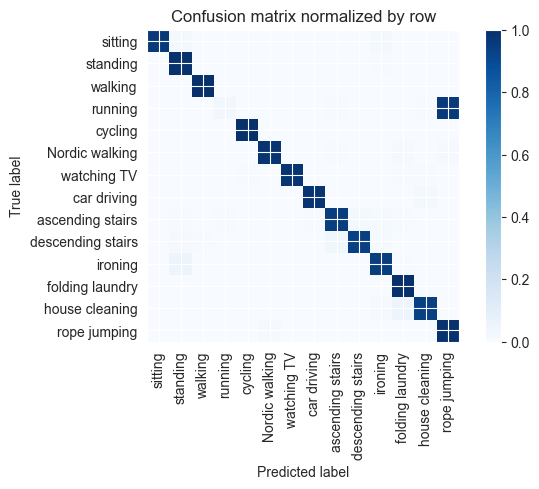

Training Epoch:  73%|███████▎  | 11/15 [07:58<02:54, 43.60s/it]

Overall accuracy: 0.928

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.996      0.997      0.122        470|	 ascending stairs: 0.002,	standing: 0.002,	
          ironing       0.958      0.947      0.953      0.119        457|	 standing: 0.048,	folding laundry: 0.004,	
         standing       0.919      0.992      0.954      0.098        376|	 ironing: 0.005,	sitting: 0.003,	
          sitting       0.994      0.959      0.977      0.096        369|	 ironing: 0.022,	standing: 0.016,	
   Nordic walking       0.997      0.978      0.987      0.093        358|	 rope jumping: 0.008,	folding laundry: 0.008,	
   house cleaning       0.988      0.935      0.961      0.089        340|	 folding laundry: 0.050,	ironing: 0.009,	
          cycling       0.997      0.997      0.997      0.082        316|	 ascending stairs: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.943      0.947      0.945      0.054  


train: 100%|██████████| 242/242 [00:38<00:00,  6.23batch/s, loss=289, accuracy=0.969]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.70batch/s, loss=317]


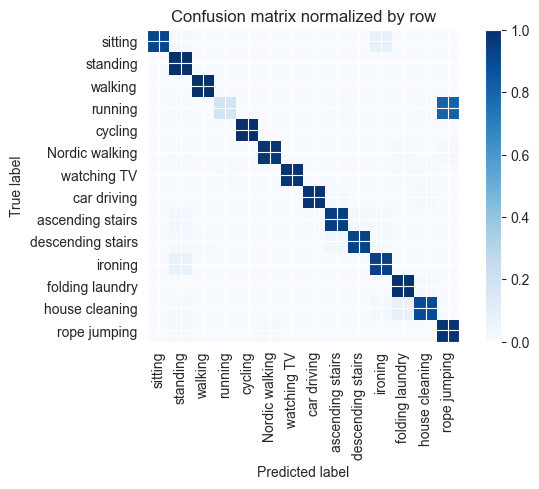

Training Epoch:  80%|████████  | 12/15 [08:42<02:11, 43.76s/it]

Overall accuracy: 0.923

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.918      0.931      0.924      0.121        466|	 standing: 0.067,	folding laundry: 0.002,	
          walking       0.998      0.998      0.998      0.121        466|	 standing: 0.002,	rope jumping: 0.000,	
         standing       0.876      0.995      0.931      0.098        375|	 ironing: 0.003,	sitting: 0.003,	
          sitting       0.991      0.914      0.951      0.096        370|	 ironing: 0.073,	standing: 0.014,	
   Nordic walking       0.997      0.969      0.983      0.093        356|	 rope jumping: 0.008,	folding laundry: 0.008,	
   house cleaning       0.984      0.891      0.935      0.089        340|	 folding laundry: 0.076,	ironing: 0.018,	
          cycling       0.997      1.000      0.998      0.083        317|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.957      0.943      0.950      0.055        


train: 100%|██████████| 242/242 [00:38<00:00,  6.34batch/s, loss=290, accuracy=0.906]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.82batch/s, loss=307]


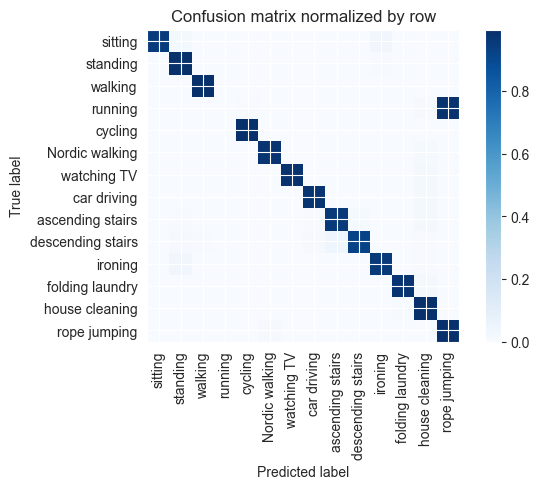

Training Epoch:  87%|████████▋ | 13/15 [09:25<01:27, 43.64s/it]

Overall accuracy: 0.931

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.996      0.997      0.122        469|	 ascending stairs: 0.002,	standing: 0.002,	
          ironing       0.969      0.959      0.964      0.120        462|	 standing: 0.035,	house cleaning: 0.006,	
         standing       0.932      0.992      0.961      0.098        376|	 ironing: 0.005,	sitting: 0.003,	
          sitting       0.997      0.952      0.974      0.097        372|	 ironing: 0.032,	standing: 0.016,	
   Nordic walking       0.997      0.978      0.987      0.093        356|	 house cleaning: 0.014,	rope jumping: 0.003,	
   house cleaning       0.934      0.991      0.962      0.089        342|	 folding laundry: 0.006,	standing: 0.003,	
          cycling       0.994      0.997      0.995      0.081        311|	 ascending stairs: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.943      0.957      0.950      0.054   


train: 100%|██████████| 242/242 [00:38<00:00,  6.27batch/s, loss=313, accuracy=0.953]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.69batch/s, loss=294]


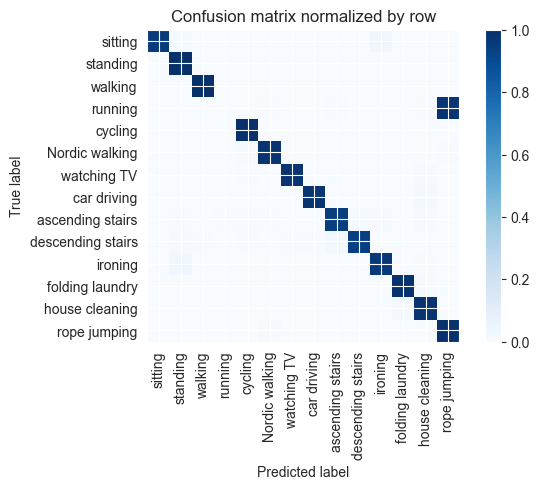

Training Epoch:  93%|█████████▎| 14/15 [10:09<00:43, 43.70s/it]

Overall accuracy: 0.933

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.998      0.998      0.122        470|	 standing: 0.002,	rope jumping: 0.000,	
          ironing       0.967      0.957      0.962      0.121        466|	 standing: 0.039,	house cleaning: 0.004,	
         standing       0.931      0.995      0.962      0.098        377|	 ironing: 0.003,	sitting: 0.003,	
          sitting       0.997      0.954      0.975      0.096        367|	 ironing: 0.033,	standing: 0.014,	
   Nordic walking       0.991      0.978      0.984      0.093        356|	 cycling: 0.011,	rope jumping: 0.006,	
   house cleaning       0.965      0.979      0.972      0.089        341|	 folding laundry: 0.018,	standing: 0.003,	
          cycling       0.978      1.000      0.989      0.081        312|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.961      0.947      0.954      0.054        209|	 de


train: 100%|██████████| 242/242 [00:38<00:00,  6.32batch/s, loss=270, accuracy=0.922]


torch.Size([14, 1024])



seen: 100%|██████████| 60/60 [00:04<00:00, 12.99batch/s, loss=276]


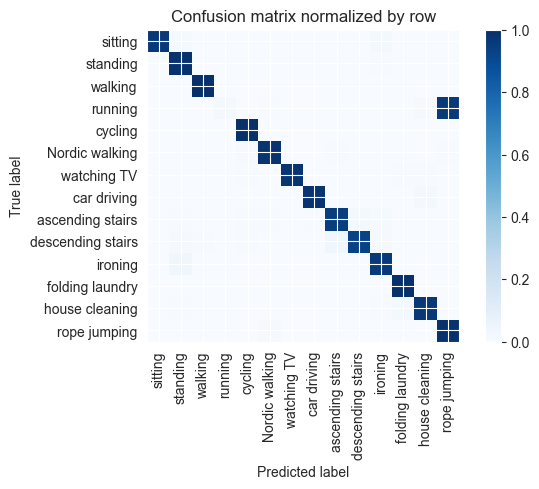

Overall accuracy: 0.933

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.998      0.998      0.998      0.122        468|	 standing: 0.002,	rope jumping: 0.000,	
          ironing       0.963      0.959      0.961      0.120        462|	 standing: 0.039,	folding laundry: 0.002,	
         standing       0.927      0.992      0.959      0.097        373|	 ironing: 0.005,	sitting: 0.003,	
          sitting       0.997      0.965      0.981      0.097        371|	 ironing: 0.022,	standing: 0.013,	
   Nordic walking       0.991      0.977      0.984      0.092        353|	 cycling: 0.011,	rope jumping: 0.006,	
   house cleaning       0.985      0.968      0.976      0.089        340|	 folding laundry: 0.021,	ironing: 0.006,	
          cycling       0.978      1.000      0.989      0.082        316|	 rope jumping: 0.000,	house cleaning: 0.000,	
 ascending stairs       0.957      0.948      0.952      0.055        210|	 de

unseen: 100%|██████████| 111/111 [00:08<00:00, 13.68batch/s, loss=402]


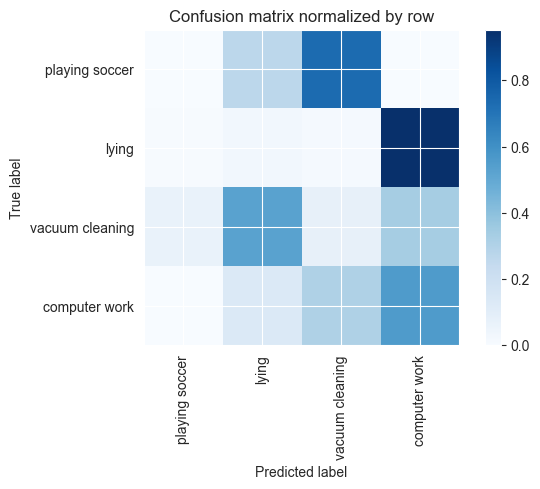

Overall accuracy: 0.266

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.421      0.557      0.479      0.432       3067|	 vacuum cleaning: 0.307,	lying: 0.134,	
          lying       0.035      0.028      0.031      0.264       1876|	 computer work: 0.952,	vacuum cleaning: 0.014,	
vacuum cleaning       0.092      0.077      0.084      0.240       1707|	 lying: 0.526,	computer work: 0.332,	
 playing soccer       0.000      0.000      0.000      0.064        454|	 vacuum cleaning: 0.736,	lying: 0.264,	computer work: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.213      0.266      0.235        1.0       7104|	      

{'accuracy': 0.26646959459459457, 'precision': 0.13697851235288738, 'recall': 0.1655673094844457, 'f1': 0.1486222679785148}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walking'

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 1024])



train: 100%|██████████| 276/276 [00:43<00:00,  6.32batch/s, loss=368, accuracy=0.828]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.96batch/s, loss=340]


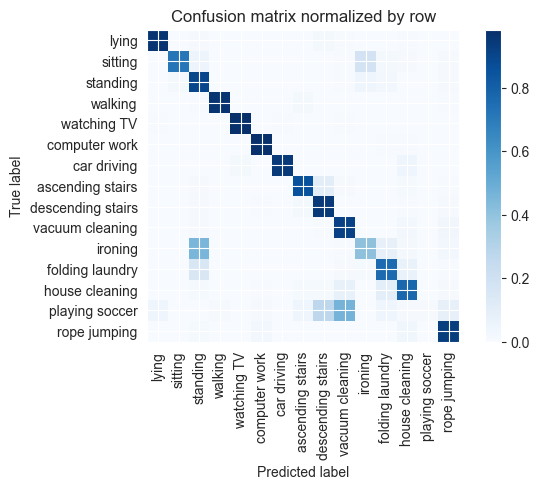

Training Epoch:   7%|▋         | 1/15 [00:49<11:34, 49.64s/it]

Overall accuracy: 0.824

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.984      0.985      0.137        607|	 house cleaning: 0.005,	folding laundry: 0.005,	
          ironing       0.686      0.406      0.510      0.108        478|	 standing: 0.456,	folding laundry: 0.079,	
          walking       0.998      0.966      0.981      0.099        439|	 ascending stairs: 0.016,	rope jumping: 0.007,	
          sitting       0.972      0.721      0.828      0.088        387|	 ironing: 0.178,	standing: 0.049,	
   house cleaning       0.845      0.775      0.808      0.087        386|	 folding laundry: 0.098,	vacuum cleaning: 0.070,	
         standing       0.530      0.896      0.666      0.083        365|	 ironing: 0.041,	folding laundry: 0.027,	
            lying       0.986      0.961      0.973      0.081        356|	 descending stairs: 0.017,	standing: 0.008,	
  vacuum cleaning       0.796      0.915     


train: 100%|██████████| 276/276 [00:43<00:00,  6.28batch/s, loss=324, accuracy=0.969]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.85batch/s, loss=346]


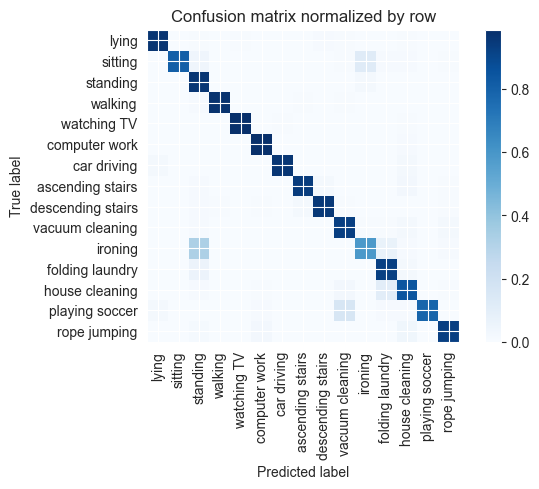

Training Epoch:  13%|█▎        | 2/15 [01:39<10:46, 49.77s/it]

Overall accuracy: 0.894

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.985      0.989      0.987      0.139        612|	 house cleaning: 0.008,	watching TV: 0.002,	
          ironing       0.831      0.586      0.687      0.108        478|	 standing: 0.322,	folding laundry: 0.067,	
          walking       0.998      0.975      0.986      0.099        437|	 standing: 0.011,	ascending stairs: 0.007,	
   house cleaning       0.889      0.848      0.868      0.088        388|	 folding laundry: 0.103,	vacuum cleaning: 0.026,	
          sitting       0.994      0.811      0.893      0.087        386|	 ironing: 0.119,	standing: 0.039,	
         standing       0.636      0.962      0.766      0.083        365|	 ironing: 0.022,	rope jumping: 0.003,	
  vacuum cleaning       0.909      0.929      0.919      0.080        354|	 rope jumping: 0.023,	house cleaning: 0.020,	
            lying       0.988      0.966      0.977    


train: 100%|██████████| 276/276 [00:43<00:00,  6.31batch/s, loss=345, accuracy=0.969]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.93batch/s, loss=351]


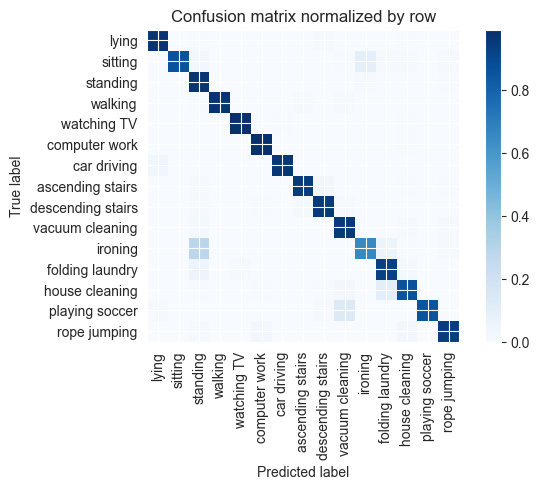

Training Epoch:  20%|██        | 3/15 [02:29<09:56, 49.67s/it]

Overall accuracy: 0.911

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.990      0.990      0.138        611|	 house cleaning: 0.007,	ascending stairs: 0.002,	
          ironing       0.884      0.653      0.751      0.108        478|	 standing: 0.276,	folding laundry: 0.052,	
          walking       1.000      0.973      0.986      0.099        439|	 vacuum cleaning: 0.011,	ascending stairs: 0.009,	
          sitting       0.994      0.855      0.919      0.088        387|	 ironing: 0.090,	standing: 0.026,	
   house cleaning       0.932      0.855      0.892      0.087        386|	 folding laundry: 0.093,	vacuum cleaning: 0.028,	
         standing       0.676      0.973      0.798      0.083        365|	 ironing: 0.011,	rope jumping: 0.005,	
            lying       0.983      0.969      0.976      0.080        354|	 descending stairs: 0.008,	house cleaning: 0.006,	
  vacuum cleaning       0.908      0.9


train: 100%|██████████| 276/276 [00:43<00:00,  6.28batch/s, loss=358, accuracy=0.953]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.36batch/s, loss=315]


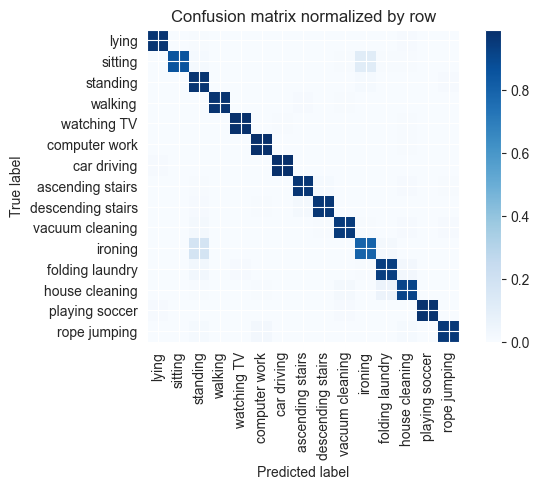

Training Epoch:  27%|██▋       | 4/15 [03:19<09:08, 49.82s/it]

Overall accuracy: 0.936

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.992      0.991      0.138        611|	 house cleaning: 0.007,	watching TV: 0.002,	
          ironing       0.876      0.795      0.834      0.108        479|	 standing: 0.177,	folding laundry: 0.023,	
          walking       1.000      0.972      0.986      0.099        436|	 ascending stairs: 0.011,	vacuum cleaning: 0.005,	
   house cleaning       0.934      0.912      0.923      0.088        387|	 folding laundry: 0.054,	vacuum cleaning: 0.018,	
          sitting       0.997      0.855      0.921      0.088        387|	 ironing: 0.114,	standing: 0.013,	
         standing       0.760      0.970      0.852      0.082        363|	 ironing: 0.014,	rope jumping: 0.008,	
            lying       0.994      0.972      0.983      0.081        356|	 house cleaning: 0.011,	standing: 0.006,	
  vacuum cleaning       0.963      0.949      0.956 


train: 100%|██████████| 276/276 [00:43<00:00,  6.30batch/s, loss=335, accuracy=0.953]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 13.00batch/s, loss=353]


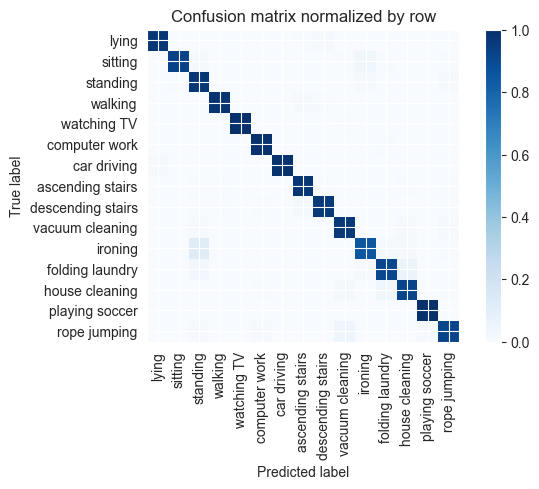

Training Epoch:  33%|███▎      | 5/15 [04:08<08:17, 49.75s/it]

Overall accuracy: 0.950

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.993      0.992      0.993      0.138        611|	 folding laundry: 0.005,	descending stairs: 0.002,	
          ironing       0.951      0.848      0.896      0.109        480|	 standing: 0.121,	folding laundry: 0.013,	
          walking       0.995      0.977      0.986      0.099        438|	 ascending stairs: 0.011,	descending stairs: 0.005,	
   house cleaning       0.942      0.920      0.931      0.088        388|	 folding laundry: 0.036,	vacuum cleaning: 0.023,	
          sitting       0.992      0.930      0.960      0.087        385|	 ironing: 0.039,	standing: 0.013,	
         standing       0.819      0.973      0.889      0.082        364|	 rope jumping: 0.011,	ironing: 0.008,	
            lying       0.994      0.972      0.983      0.080        355|	 descending stairs: 0.008,	ascending stairs: 0.006,	
  vacuum cleaning       0.947   


train: 100%|██████████| 276/276 [00:44<00:00,  6.25batch/s, loss=345, accuracy=0.953]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.37batch/s, loss=359]


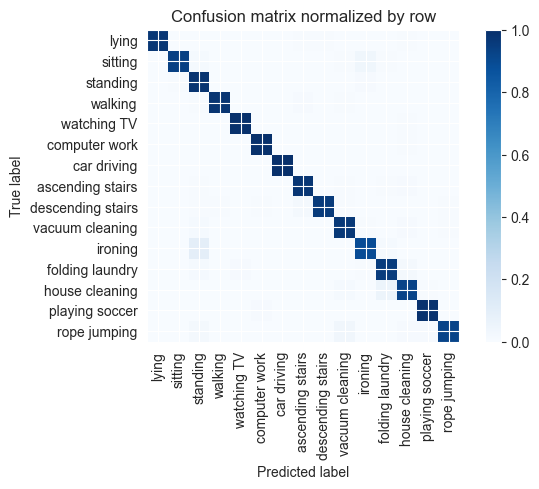

Training Epoch:  40%|████      | 6/15 [04:59<07:29, 49.95s/it]

Overall accuracy: 0.958

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.993      0.994      0.139        612|	 house cleaning: 0.005,	ascending stairs: 0.002,	
          ironing       0.953      0.887      0.919      0.108        479|	 standing: 0.096,	folding laundry: 0.013,	
          walking       0.998      0.980      0.989      0.100        440|	 ascending stairs: 0.009,	vacuum cleaning: 0.005,	
          sitting       0.992      0.935      0.963      0.088        387|	 ironing: 0.036,	standing: 0.013,	
   house cleaning       0.952      0.922      0.937      0.087        386|	 folding laundry: 0.052,	vacuum cleaning: 0.016,	
         standing       0.844      0.981      0.907      0.082        364|	 ironing: 0.011,	sitting: 0.005,	
  vacuum cleaning       0.955      0.963      0.959      0.080        354|	 standing: 0.014,	house cleaning: 0.008,	
            lying       1.000      0.972      0.986 


train: 100%|██████████| 276/276 [00:43<00:00,  6.30batch/s, loss=343, accuracy=0.984]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.54batch/s, loss=338]


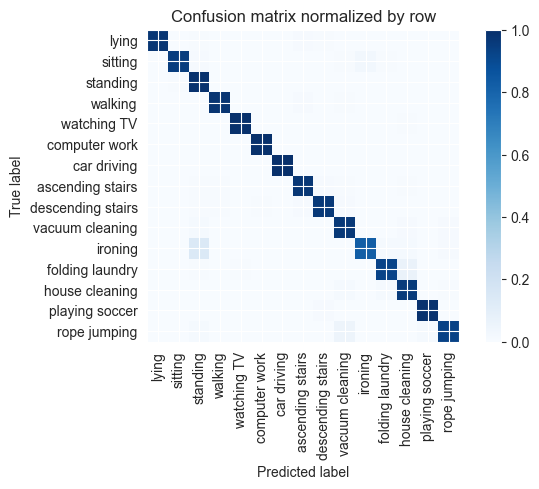

Training Epoch:  47%|████▋     | 7/15 [05:48<06:39, 49.91s/it]

Overall accuracy: 0.955

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.993      0.995      0.138        609|	 house cleaning: 0.003,	folding laundry: 0.002,	
          ironing       0.973      0.820      0.890      0.108        479|	 standing: 0.140,	house cleaning: 0.015,	
          walking       0.995      0.979      0.987      0.099        437|	 ascending stairs: 0.009,	vacuum cleaning: 0.007,	
   house cleaning       0.921      0.956      0.938      0.088        388|	 folding laundry: 0.015,	vacuum cleaning: 0.015,	
          sitting       0.995      0.946      0.970      0.088        387|	 ironing: 0.028,	standing: 0.010,	
         standing       0.811      0.989      0.891      0.083        365|	 sitting: 0.005,	folding laundry: 0.003,	
            lying       0.997      0.975      0.986      0.081        356|	 ascending stairs: 0.008,	descending stairs: 0.006,	
  vacuum cleaning       0.947      


train: 100%|██████████| 276/276 [00:43<00:00,  6.27batch/s, loss=339, accuracy=0.938]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.85batch/s, loss=324]


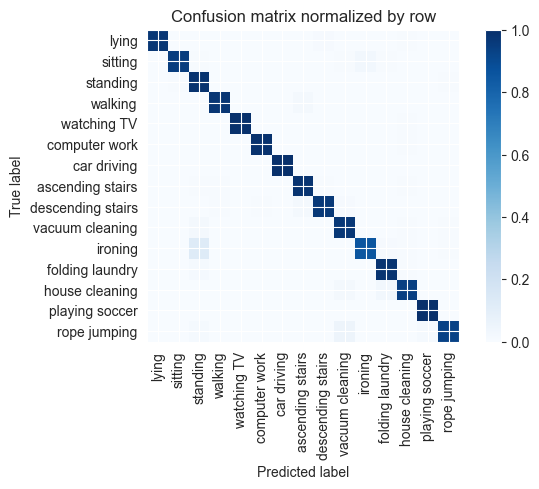

Training Epoch:  53%|█████▎    | 8/15 [06:38<05:49, 49.90s/it]

Overall accuracy: 0.960

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.992      0.995      0.139        613|	 house cleaning: 0.005,	ironing: 0.002,	
          ironing       0.964      0.855      0.906      0.108        475|	 standing: 0.122,	folding laundry: 0.011,	
          walking       0.995      0.975      0.985      0.099        439|	 ascending stairs: 0.016,	rope jumping: 0.002,	
   house cleaning       0.963      0.941      0.952      0.088        388|	 folding laundry: 0.031,	vacuum cleaning: 0.018,	
          sitting       0.995      0.948      0.971      0.087        386|	 ironing: 0.028,	standing: 0.008,	
         standing       0.831      0.986      0.902      0.083        365|	 rope jumping: 0.005,	sitting: 0.005,	
            lying       0.997      0.969      0.983      0.080        355|	 descending stairs: 0.008,	house cleaning: 0.006,	
  vacuum cleaning       0.950      0.966      0.95


train: 100%|██████████| 276/276 [00:44<00:00,  6.25batch/s, loss=325, accuracy=0.984]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 13.01batch/s, loss=335]


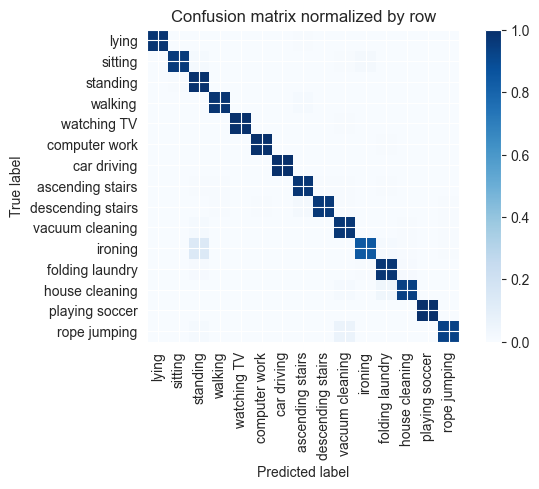

Training Epoch:  60%|██████    | 9/15 [07:28<04:59, 49.91s/it]

Overall accuracy: 0.959

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.993      0.996      0.139        613|	 folding laundry: 0.005,	lying: 0.002,	
          ironing       0.973      0.841      0.902      0.108        477|	 standing: 0.134,	folding laundry: 0.013,	
          walking       0.995      0.980      0.987      0.100        440|	 ascending stairs: 0.014,	rope jumping: 0.002,	
   house cleaning       0.978      0.936      0.957      0.088        388|	 folding laundry: 0.039,	vacuum cleaning: 0.015,	
          sitting       0.992      0.953      0.972      0.087        386|	 ironing: 0.023,	standing: 0.013,	
         standing       0.817      0.989      0.894      0.082        360|	 sitting: 0.006,	rope jumping: 0.003,	
            lying       0.994      0.978      0.986      0.081        356|	 ascending stairs: 0.006,	house cleaning: 0.003,	
  vacuum cleaning       0.950      0.969      0.959 


train: 100%|██████████| 276/276 [00:43<00:00,  6.31batch/s, loss=343, accuracy=0.938]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.94batch/s, loss=357]


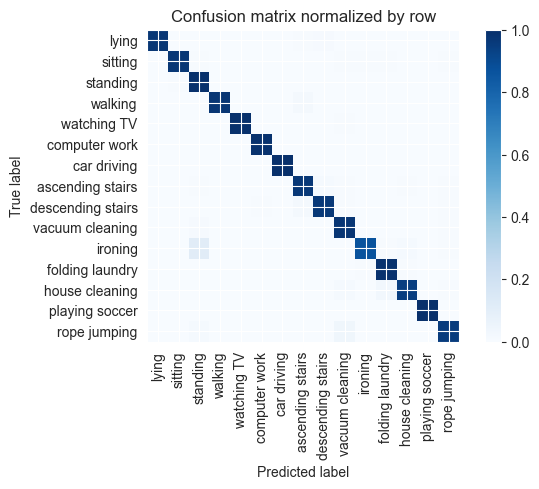

Training Epoch:  67%|██████▋   | 10/15 [08:18<04:09, 49.81s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.992      0.995      0.139        613|	 folding laundry: 0.003,	house cleaning: 0.002,	
          ironing       0.990      0.866      0.924      0.108        479|	 standing: 0.111,	house cleaning: 0.013,	
          walking       1.000      0.975      0.987      0.099        438|	 ascending stairs: 0.016,	house cleaning: 0.002,	
          sitting       0.995      0.969      0.982      0.088        387|	 standing: 0.008,	rope jumping: 0.005,	
   house cleaning       0.966      0.943      0.954      0.087        386|	 folding laundry: 0.031,	vacuum cleaning: 0.013,	
         standing       0.851      0.994      0.917      0.082        363|	 sitting: 0.006,	rope jumping: 0.000,	
            lying       0.994      0.972      0.983      0.081        356|	 descending stairs: 0.011,	ascending stairs: 0.006,	
  vacuum cleaning       0.955     


train: 100%|██████████| 276/276 [00:44<00:00,  6.23batch/s, loss=324, accuracy=1]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.82batch/s, loss=339]


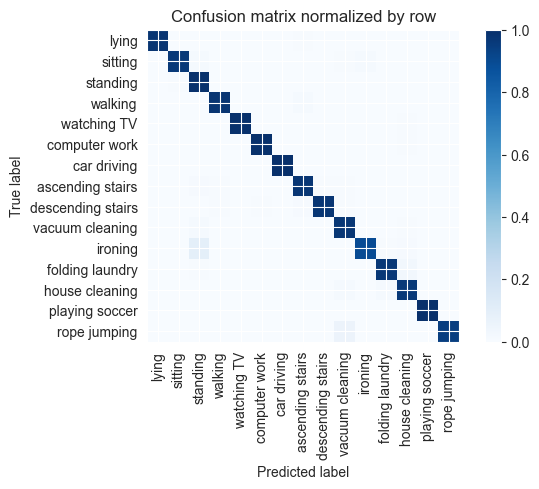

Training Epoch:  73%|███████▎  | 11/15 [09:08<03:19, 49.91s/it]

Overall accuracy: 0.969

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.993      0.996      0.139        613|	 house cleaning: 0.005,	lying: 0.002,	
          ironing       0.984      0.891      0.935      0.108        479|	 standing: 0.092,	house cleaning: 0.008,	
          walking       0.995      0.979      0.987      0.099        439|	 ascending stairs: 0.014,	rope jumping: 0.002,	
   house cleaning       0.954      0.961      0.958      0.088        388|	 vacuum cleaning: 0.015,	folding laundry: 0.013,	
          sitting       0.992      0.961      0.976      0.087        385|	 ironing: 0.016,	standing: 0.013,	
         standing       0.862      0.994      0.923      0.082        363|	 sitting: 0.006,	rope jumping: 0.000,	
  vacuum cleaning       0.953      0.969      0.961      0.080        353|	 standing: 0.014,	house cleaning: 0.006,	
            lying       0.994      0.980      0.987      0.080


train: 100%|██████████| 276/276 [00:44<00:00,  6.27batch/s, loss=323, accuracy=0.984]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.75batch/s, loss=327]


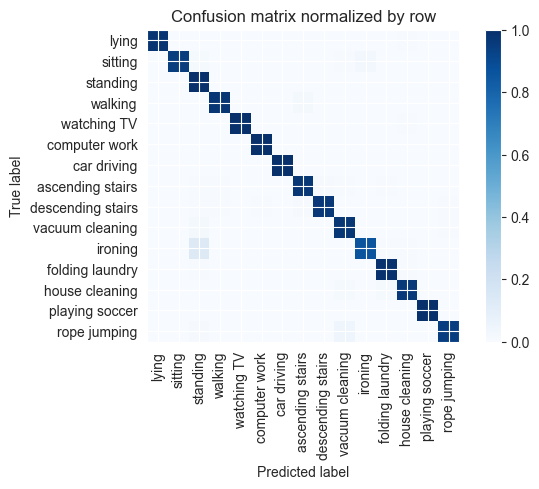

Training Epoch:  80%|████████  | 12/15 [09:58<02:29, 49.93s/it]

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.997      0.998      0.138        610|	 watching TV: 0.002,	standing: 0.002,	
          ironing       0.969      0.856      0.909      0.108        478|	 standing: 0.132,	folding laundry: 0.006,	
          walking       0.995      0.975      0.985      0.100        440|	 ascending stairs: 0.016,	house cleaning: 0.002,	
          sitting       0.995      0.948      0.971      0.088        387|	 ironing: 0.028,	standing: 0.016,	
   house cleaning       0.976      0.961      0.969      0.087        386|	 folding laundry: 0.016,	vacuum cleaning: 0.016,	
         standing       0.814      0.995      0.895      0.083        365|	 ironing: 0.003,	sitting: 0.003,	
            lying       1.000      0.980      0.990      0.080        355|	 house cleaning: 0.006,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.958      0.972      0.965      


train: 100%|██████████| 276/276 [00:44<00:00,  6.26batch/s, loss=330, accuracy=0.938]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.88batch/s, loss=324]


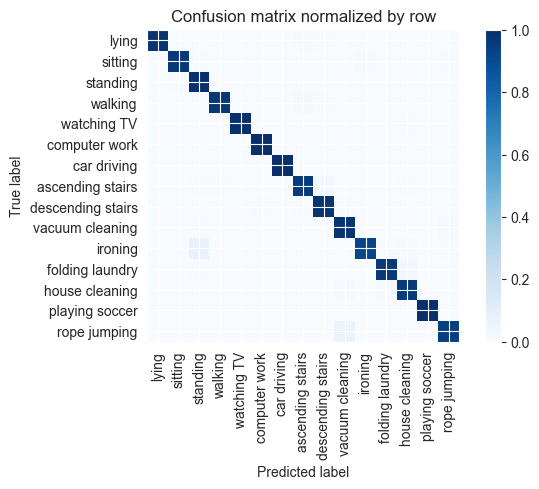

Training Epoch:  87%|████████▋ | 13/15 [10:48<01:39, 49.93s/it]

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.997      0.998      0.138        609|	 playing soccer: 0.002,	watching TV: 0.002,	
          ironing       0.984      0.910      0.946      0.108        479|	 standing: 0.067,	house cleaning: 0.013,	
          walking       0.998      0.972      0.985      0.099        436|	 ascending stairs: 0.021,	descending stairs: 0.005,	
   house cleaning       0.959      0.961      0.960      0.088        387|	 vacuum cleaning: 0.016,	folding laundry: 0.013,	
          sitting       0.995      0.966      0.980      0.088        387|	 ironing: 0.013,	standing: 0.008,	
         standing       0.901      0.995      0.945      0.083        365|	 sitting: 0.005,	rope jumping: 0.000,	
            lying       0.997      0.980      0.989      0.081        356|	 ascending stairs: 0.008,	descending stairs: 0.006,	
  vacuum cleaning       0.961      0.977


train: 100%|██████████| 276/276 [00:44<00:00,  6.24batch/s, loss=363, accuracy=0.906]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.18batch/s, loss=311]


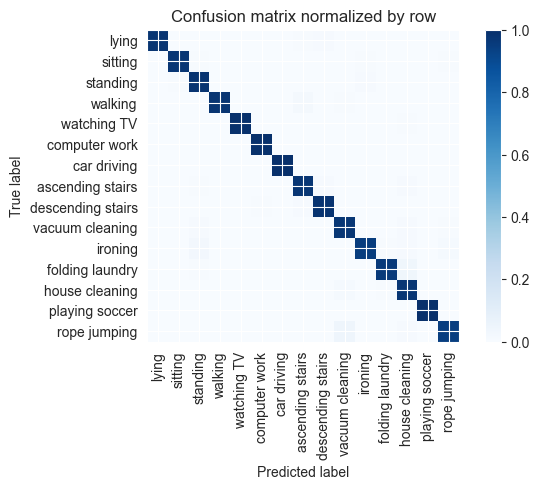

Training Epoch:  93%|█████████▎| 14/15 [11:38<00:50, 50.07s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.993      0.996      0.138        611|	 playing soccer: 0.002,	folding laundry: 0.002,	
          ironing       0.987      0.948      0.967      0.108        479|	 standing: 0.027,	rope jumping: 0.013,	
          walking       1.000      0.977      0.988      0.099        438|	 ascending stairs: 0.016,	vacuum cleaning: 0.005,	
          sitting       0.995      0.974      0.984      0.088        388|	 ironing: 0.008,	standing: 0.008,	
   house cleaning       0.949      0.974      0.962      0.087        386|	 vacuum cleaning: 0.016,	folding laundry: 0.005,	
         standing       0.940      0.984      0.961      0.082        364|	 ironing: 0.008,	sitting: 0.005,	
            lying       0.994      0.980      0.987      0.081        356|	 descending stairs: 0.008,	ascending stairs: 0.006,	
  vacuum cleaning       0.963      0.969     


train: 100%|██████████| 276/276 [00:44<00:00,  6.26batch/s, loss=328, accuracy=1]


torch.Size([15, 1024])



seen: 100%|██████████| 69/69 [00:05<00:00, 12.69batch/s, loss=302]


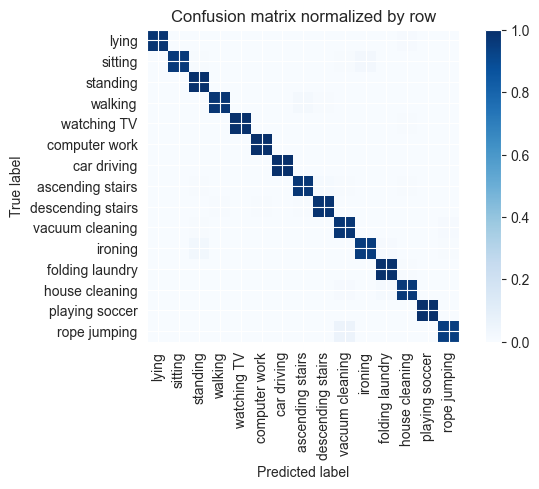

Overall accuracy: 0.978

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      1.000      0.999      0.138        610|	 rope jumping: 0.000,	playing soccer: 0.000,	
          ironing       0.974      0.952      0.963      0.109        480|	 standing: 0.031,	folding laundry: 0.008,	
          walking       0.998      0.975      0.986      0.100        440|	 ascending stairs: 0.018,	descending stairs: 0.005,	
          sitting       0.992      0.959      0.975      0.088        388|	 ironing: 0.026,	standing: 0.008,	
   house cleaning       0.979      0.964      0.971      0.087        385|	 folding laundry: 0.016,	vacuum cleaning: 0.010,	
         standing       0.943      0.994      0.968      0.082        363|	 ironing: 0.003,	sitting: 0.003,	
  vacuum cleaning       0.966      0.975      0.971      0.080        355|	 rope jumping: 0.011,	standing: 0.006,	
            lying       0.997      0.980      0.989     

torch.Size([3, 1024])


unseen: 100%|██████████| 68/68 [00:05<00:00, 13.17batch/s, loss=243]


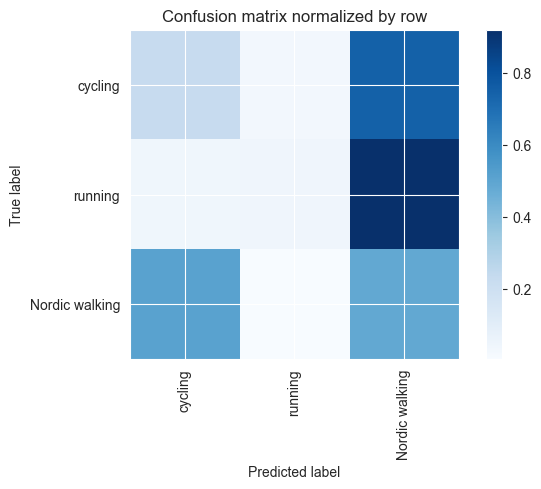

Overall accuracy: 0.295

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.302      0.485      0.373      0.420       1828|	 cycling: 0.511,	running: 0.003,	
       cycling       0.270      0.226      0.246      0.364       1586|	 Nordic walking: 0.746,	running: 0.028,	
       running       0.433      0.042      0.076      0.216        938|	 Nordic walking: 0.921,	cycling: 0.037,	

----------------------------------------------------------------------------------------------------
   avg / total       0.319      0.295      0.262        1.0       4352|	      

{'accuracy': 0.29503676470588236, 'precision': 0.33507643388824554, 'recall': 0.2508442263457498, 'f1': 0.23137279983049633}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 1024])



train: 100%|██████████| 283/283 [00:44<00:00,  6.30batch/s, loss=348, accuracy=0.844]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.88batch/s, loss=338]


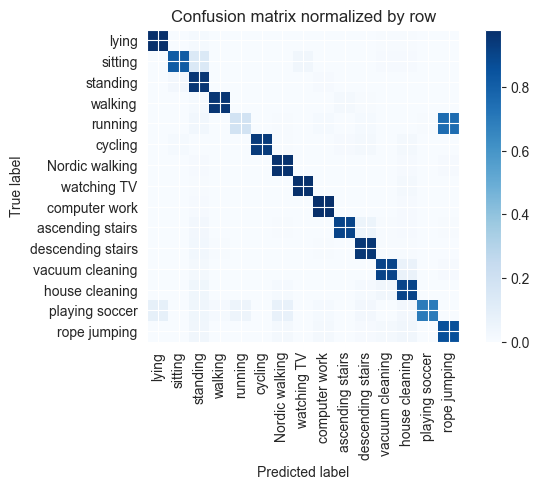

Training Epoch:   7%|▋         | 1/15 [00:50<11:52, 50.90s/it]

Overall accuracy: 0.902

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.984      0.979      0.982      0.140        628|	 house cleaning: 0.010,	standing: 0.008,	
          walking       0.996      0.954      0.974      0.106        475|	 ascending stairs: 0.021,	standing: 0.015,	
   Nordic walking       0.953      0.971      0.962      0.084        377|	 rope jumping: 0.008,	house cleaning: 0.008,	
            lying       0.981      0.976      0.978      0.082        368|	 standing: 0.014,	house cleaning: 0.005,	
         standing       0.765      0.956      0.850      0.081        361|	 sitting: 0.025,	computer work: 0.011,	
  vacuum cleaning       0.929      0.905      0.917      0.080        359|	 house cleaning: 0.061,	standing: 0.017,	
          sitting       0.949      0.813      0.876      0.076        342|	 standing: 0.135,	watching TV: 0.032,	
   house cleaning       0.848      0.900      0.873      0.076


train: 100%|██████████| 283/283 [00:44<00:00,  6.30batch/s, loss=326, accuracy=0.844]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.69batch/s, loss=331]


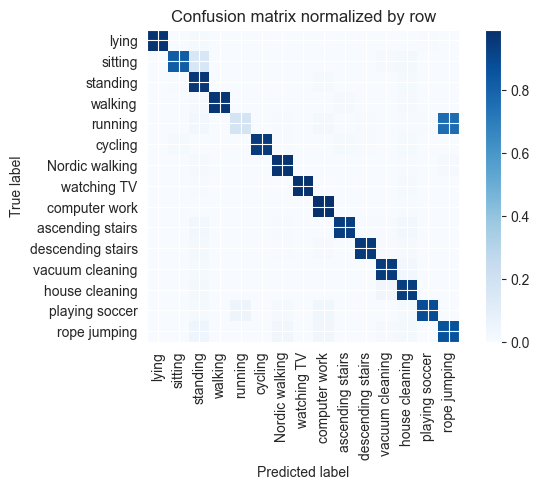

Training Epoch:  13%|█▎        | 2/15 [01:41<11:01, 50.92s/it]

Overall accuracy: 0.920

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.975      0.992      0.984      0.141        631|	 house cleaning: 0.005,	standing: 0.003,	
          walking       1.000      0.966      0.983      0.105        471|	 standing: 0.011,	house cleaning: 0.008,	
   Nordic walking       0.969      0.976      0.972      0.085        380|	 rope jumping: 0.008,	standing: 0.008,	
            lying       1.000      0.975      0.987      0.081        364|	 standing: 0.014,	playing soccer: 0.005,	
         standing       0.780      0.964      0.862      0.081        361|	 house cleaning: 0.014,	computer work: 0.014,	
  vacuum cleaning       0.944      0.949      0.947      0.079        355|	 house cleaning: 0.025,	standing: 0.014,	
   house cleaning       0.873      0.939      0.904      0.077        343|	 vacuum cleaning: 0.032,	standing: 0.020,	
          sitting       0.975      0.820      0.891      0.


train: 100%|██████████| 283/283 [00:45<00:00,  6.21batch/s, loss=323, accuracy=0.922]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.88batch/s, loss=341]


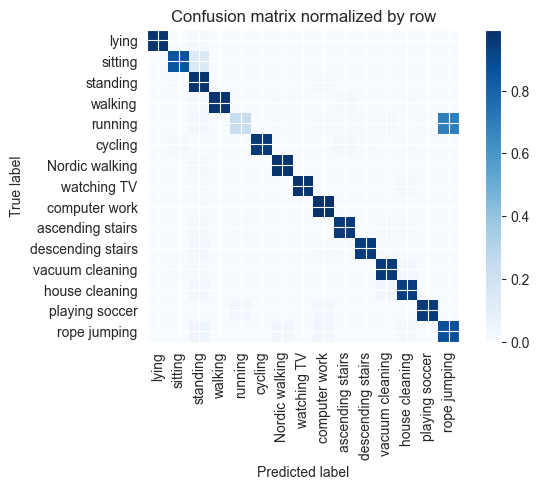

Training Epoch:  20%|██        | 3/15 [02:33<10:14, 51.20s/it]

Overall accuracy: 0.931

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.977      0.994      0.985      0.140        628|	 standing: 0.005,	house cleaning: 0.002,	
          walking       1.000      0.971      0.985      0.106        476|	 ascending stairs: 0.011,	standing: 0.011,	
   Nordic walking       0.982      0.982      0.982      0.085        380|	 standing: 0.011,	rope jumping: 0.003,	
            lying       1.000      0.978      0.989      0.082        366|	 standing: 0.014,	playing soccer: 0.003,	
         standing       0.786      0.981      0.873      0.080        360|	 computer work: 0.011,	sitting: 0.006,	
  vacuum cleaning       0.949      0.955      0.952      0.079        352|	 house cleaning: 0.026,	standing: 0.011,	
          sitting       0.977      0.858      0.913      0.077        344|	 standing: 0.134,	house cleaning: 0.003,	
   house cleaning       0.933      0.936      0.934      0.076   


train: 100%|██████████| 283/283 [00:45<00:00,  6.25batch/s, loss=338, accuracy=0.922]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.95batch/s, loss=327]


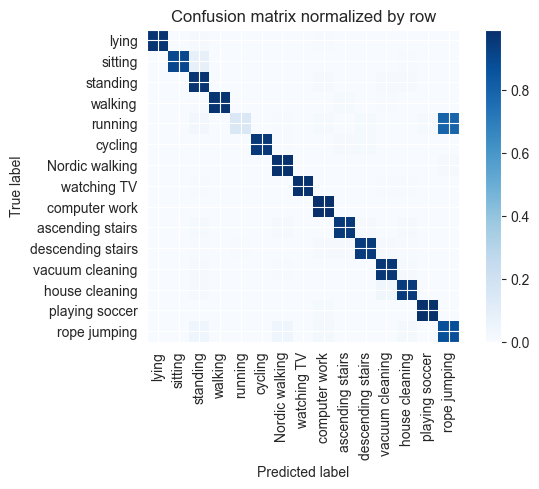

Training Epoch:  27%|██▋       | 4/15 [03:24<09:23, 51.22s/it]

Overall accuracy: 0.932

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.979      0.992      0.986      0.140        625|	 house cleaning: 0.003,	standing: 0.003,	
          walking       1.000      0.970      0.985      0.105        471|	 ascending stairs: 0.015,	vacuum cleaning: 0.004,	
   Nordic walking       0.969      0.981      0.975      0.084        376|	 rope jumping: 0.011,	house cleaning: 0.003,	
            lying       0.997      0.975      0.986      0.082        367|	 standing: 0.011,	computer work: 0.005,	
         standing       0.861      0.970      0.912      0.081        365|	 vacuum cleaning: 0.011,	house cleaning: 0.008,	
  vacuum cleaning       0.932      0.964      0.948      0.080        357|	 house cleaning: 0.014,	standing: 0.011,	
   house cleaning       0.942      0.948      0.945      0.077        344|	 vacuum cleaning: 0.038,	standing: 0.009,	
          sitting       0.990      0.901   


train: 100%|██████████| 283/283 [00:45<00:00,  6.23batch/s, loss=326, accuracy=0.969]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.73batch/s, loss=317]


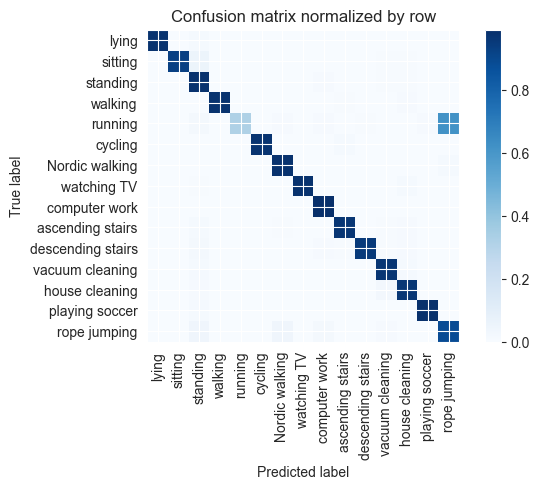

Training Epoch:  33%|███▎      | 5/15 [04:16<08:32, 51.30s/it]

Overall accuracy: 0.946

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.983      0.992      0.987      0.140        625|	 house cleaning: 0.003,	standing: 0.003,	
          walking       1.000      0.979      0.989      0.106        476|	 house cleaning: 0.008,	ascending stairs: 0.006,	
   Nordic walking       0.976      0.981      0.979      0.084        377|	 rope jumping: 0.013,	vacuum cleaning: 0.003,	
            lying       1.000      0.978      0.989      0.083        370|	 standing: 0.014,	house cleaning: 0.003,	
         standing       0.875      0.981      0.925      0.081        363|	 computer work: 0.008,	house cleaning: 0.006,	
  vacuum cleaning       0.953      0.967      0.960      0.080        359|	 house cleaning: 0.014,	standing: 0.014,	
   house cleaning       0.937      0.965      0.951      0.076        341|	 vacuum cleaning: 0.023,	standing: 0.009,	
          sitting       0.997      0.929    


train: 100%|██████████| 283/283 [00:45<00:00,  6.17batch/s, loss=323, accuracy=0.938]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.17batch/s, loss=329]


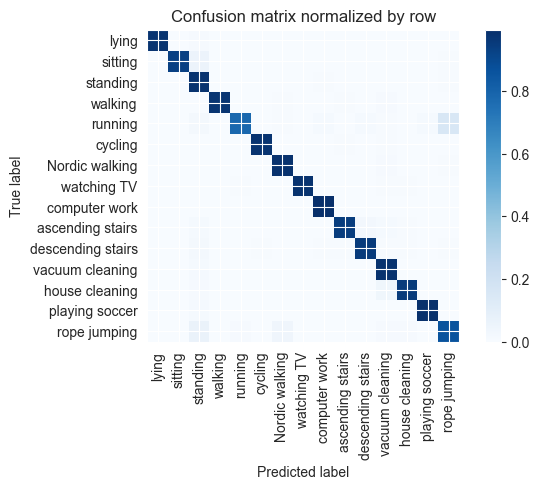

Training Epoch:  40%|████      | 6/15 [05:08<07:44, 51.60s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.989      0.995      0.992      0.140        629|	 standing: 0.003,	house cleaning: 0.002,	
          walking       1.000      0.975      0.987      0.107        479|	 vacuum cleaning: 0.008,	ascending stairs: 0.006,	
   Nordic walking       0.976      0.984      0.980      0.084        376|	 vacuum cleaning: 0.008,	rope jumping: 0.005,	
            lying       1.000      0.978      0.989      0.081        365|	 standing: 0.011,	playing soccer: 0.003,	
         standing       0.877      0.983      0.927      0.081        362|	 rope jumping: 0.006,	computer work: 0.006,	
  vacuum cleaning       0.916      0.980      0.947      0.080        358|	 standing: 0.014,	rope jumping: 0.003,	
   house cleaning       0.979      0.951      0.965      0.077        345|	 vacuum cleaning: 0.038,	standing: 0.009,	
          sitting       0.991      0.929      0


train: 100%|██████████| 283/283 [00:46<00:00,  6.03batch/s, loss=318, accuracy=0.953]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.63batch/s, loss=315]


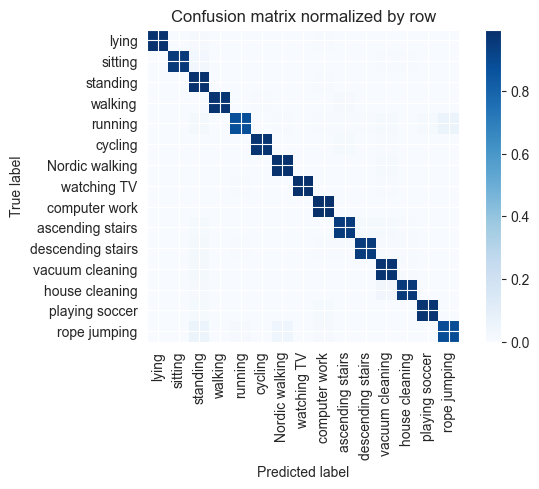

Training Epoch:  47%|████▋     | 7/15 [06:01<06:56, 52.05s/it]

Overall accuracy: 0.970

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.986      0.995      0.990      0.140        625|	 standing: 0.003,	house cleaning: 0.002,	
          walking       1.000      0.973      0.986      0.106        475|	 ascending stairs: 0.011,	cycling: 0.006,	
   Nordic walking       0.984      0.984      0.984      0.085        381|	 vacuum cleaning: 0.013,	rope jumping: 0.003,	
            lying       1.000      0.981      0.990      0.081        363|	 standing: 0.008,	computer work: 0.006,	
         standing       0.899      0.986      0.941      0.081        362|	 computer work: 0.006,	rope jumping: 0.003,	
  vacuum cleaning       0.923      0.975      0.948      0.080        357|	 standing: 0.017,	house cleaning: 0.006,	
   house cleaning       0.973      0.956      0.965      0.077        343|	 vacuum cleaning: 0.032,	standing: 0.009,	
          sitting       0.994      0.956      0.975   


train: 100%|██████████| 283/283 [00:45<00:00,  6.24batch/s, loss=312, accuracy=0.891]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.88batch/s, loss=303]


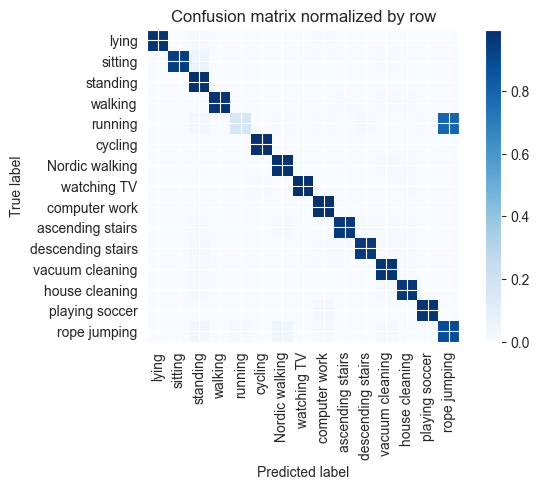

Training Epoch:  53%|█████▎    | 8/15 [06:52<06:02, 51.81s/it]

Overall accuracy: 0.944

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.986      0.995      0.990      0.140        627|	 standing: 0.003,	house cleaning: 0.002,	
          walking       1.000      0.979      0.989      0.106        474|	 house cleaning: 0.006,	vacuum cleaning: 0.006,	
   Nordic walking       0.979      0.984      0.982      0.085        381|	 vacuum cleaning: 0.008,	house cleaning: 0.005,	
            lying       1.000      0.978      0.989      0.082        367|	 standing: 0.011,	computer work: 0.005,	
         standing       0.884      0.989      0.934      0.081        363|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.941      0.975      0.957      0.080        357|	 standing: 0.014,	house cleaning: 0.006,	
   house cleaning       0.968      0.965      0.967      0.077        344|	 vacuum cleaning: 0.020,	standing: 0.012,	
          sitting       0.994      0.938    


train: 100%|██████████| 283/283 [00:46<00:00,  6.13batch/s, loss=314, accuracy=0.938]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.52batch/s, loss=316]


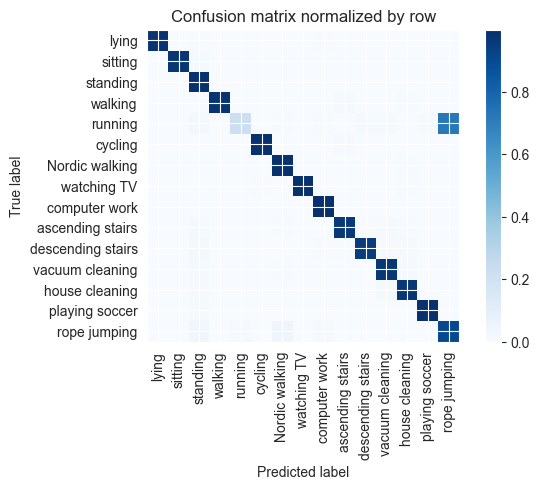

Training Epoch:  60%|██████    | 9/15 [07:44<05:11, 51.98s/it]

Overall accuracy: 0.950

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.998      0.994      0.140        629|	 house cleaning: 0.002,	rope jumping: 0.000,	
          walking       1.000      0.981      0.990      0.106        474|	 ascending stairs: 0.008,	house cleaning: 0.006,	
   Nordic walking       0.979      0.987      0.983      0.085        381|	 house cleaning: 0.005,	rope jumping: 0.003,	
            lying       1.000      0.981      0.990      0.083        370|	 computer work: 0.005,	standing: 0.005,	
         standing       0.928      0.989      0.957      0.081        364|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.953      0.969      0.961      0.079        354|	 standing: 0.014,	house cleaning: 0.008,	
          sitting       0.994      0.974      0.984      0.077        344|	 standing: 0.015,	house cleaning: 0.003,	
   house cleaning       0.957      0.971   


train: 100%|██████████| 283/283 [00:45<00:00,  6.22batch/s, loss=318, accuracy=0.984]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.88batch/s, loss=312]


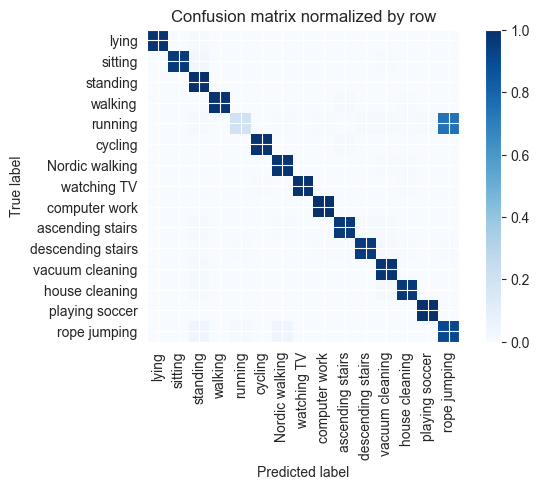

Training Epoch:  67%|██████▋   | 10/15 [08:36<04:19, 51.82s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.995      0.997      0.996      0.141        631|	 house cleaning: 0.002,	standing: 0.002,	
          walking       1.000      0.977      0.988      0.106        475|	 ascending stairs: 0.011,	house cleaning: 0.004,	
   Nordic walking       0.979      0.984      0.982      0.084        378|	 house cleaning: 0.005,	vacuum cleaning: 0.005,	
            lying       1.000      0.984      0.992      0.082        368|	 standing: 0.011,	descending stairs: 0.003,	
  vacuum cleaning       0.951      0.981      0.966      0.080        360|	 standing: 0.014,	house cleaning: 0.003,	
         standing       0.920      0.994      0.956      0.080        358|	 vacuum cleaning: 0.003,	sitting: 0.003,	
          sitting       0.994      0.965      0.979      0.076        339|	 standing: 0.024,	vacuum cleaning: 0.006,	
   house cleaning       0.973      0.967    


train: 100%|██████████| 283/283 [00:45<00:00,  6.27batch/s, loss=307, accuracy=0.953]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.76batch/s, loss=318]


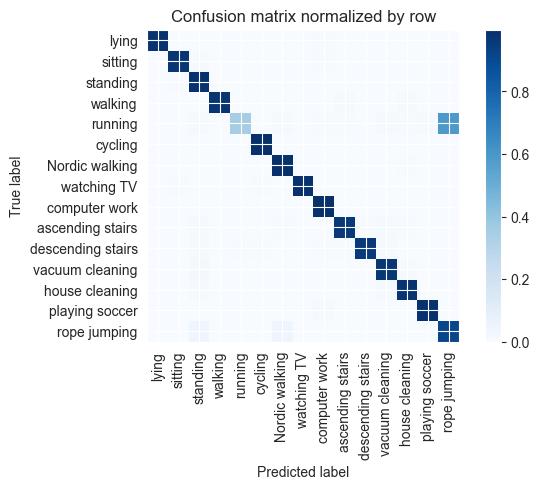

Training Epoch:  73%|███████▎  | 11/15 [09:27<03:26, 51.61s/it]

Overall accuracy: 0.957

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.997      0.992      0.140        629|	 house cleaning: 0.002,	standing: 0.002,	
          walking       1.000      0.981      0.991      0.107        479|	 house cleaning: 0.008,	ascending stairs: 0.008,	
   Nordic walking       0.979      0.989      0.984      0.085        379|	 house cleaning: 0.005,	rope jumping: 0.003,	
            lying       1.000      0.984      0.992      0.083        370|	 computer work: 0.005,	house cleaning: 0.003,	
         standing       0.932      0.986      0.958      0.080        360|	 sitting: 0.006,	rope jumping: 0.003,	
  vacuum cleaning       0.964      0.969      0.967      0.080        358|	 standing: 0.017,	house cleaning: 0.011,	
   house cleaning       0.957      0.979      0.968      0.076        341|	 vacuum cleaning: 0.012,	standing: 0.009,	
          sitting       0.988      0.971      0.


train: 100%|██████████| 283/283 [00:45<00:00,  6.23batch/s, loss=296, accuracy=0.984]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.91batch/s, loss=310]


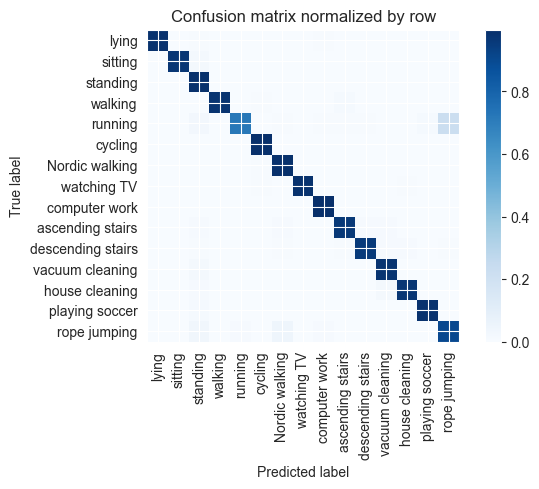

Training Epoch:  80%|████████  | 12/15 [10:18<02:34, 51.52s/it]

Overall accuracy: 0.971

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.997      0.995      0.139        623|	 house cleaning: 0.002,	standing: 0.002,	
          walking       1.000      0.979      0.989      0.106        474|	 ascending stairs: 0.013,	cycling: 0.004,	
   Nordic walking       0.979      0.990      0.984      0.086        384|	 cycling: 0.005,	rope jumping: 0.003,	
            lying       1.000      0.986      0.993      0.083        370|	 computer work: 0.005,	standing: 0.005,	
         standing       0.925      0.992      0.957      0.081        361|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.962      0.980      0.971      0.080        357|	 standing: 0.017,	house cleaning: 0.003,	
   house cleaning       0.979      0.971      0.975      0.076        342|	 vacuum cleaning: 0.018,	standing: 0.009,	
          sitting       0.994      0.971      0.982      0.0


train: 100%|██████████| 283/283 [00:45<00:00,  6.23batch/s, loss=320, accuracy=0.953]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.86batch/s, loss=320]


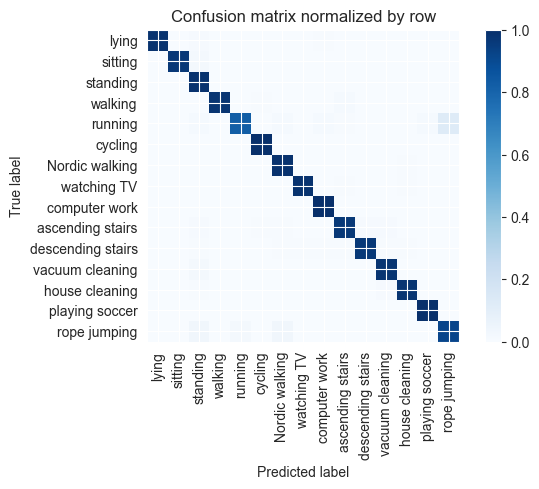

Training Epoch:  87%|████████▋ | 13/15 [11:10<01:42, 51.49s/it]

Overall accuracy: 0.976

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.997      0.994      0.140        626|	 house cleaning: 0.002,	standing: 0.002,	
          walking       1.000      0.979      0.989      0.105        471|	 ascending stairs: 0.013,	cycling: 0.004,	
   Nordic walking       0.979      0.989      0.984      0.085        380|	 house cleaning: 0.005,	rope jumping: 0.003,	
            lying       1.000      0.986      0.993      0.082        368|	 standing: 0.008,	computer work: 0.005,	
         standing       0.930      0.992      0.960      0.081        364|	 vacuum cleaning: 0.003,	computer work: 0.003,	
  vacuum cleaning       0.972      0.977      0.975      0.079        354|	 standing: 0.017,	house cleaning: 0.003,	
          sitting       0.994      0.968      0.981      0.077        343|	 standing: 0.020,	house cleaning: 0.003,	
   house cleaning       0.977      0.980      0.978  


train: 100%|██████████| 283/283 [00:45<00:00,  6.22batch/s, loss=302, accuracy=1]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.69batch/s, loss=317]


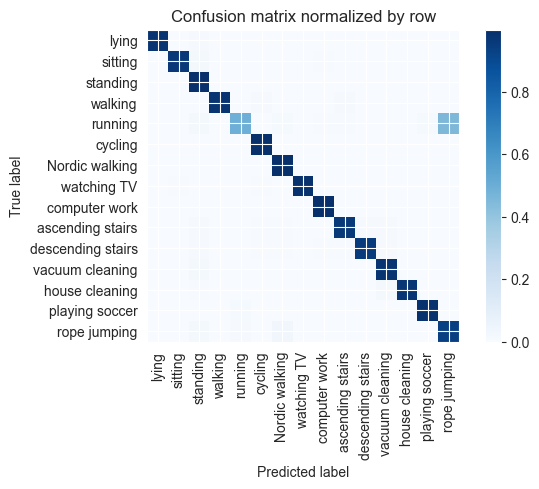

Training Epoch:  93%|█████████▎| 14/15 [12:01<00:51, 51.50s/it]

Overall accuracy: 0.964

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.992      0.998      0.995      0.139        624|	 standing: 0.002,	rope jumping: 0.000,	
          walking       1.000      0.981      0.990      0.106        477|	 ascending stairs: 0.010,	cycling: 0.008,	
   Nordic walking       0.982      0.995      0.988      0.084        375|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
            lying       1.000      0.981      0.990      0.082        369|	 standing: 0.011,	descending stairs: 0.003,	
         standing       0.925      0.992      0.957      0.081        361|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.964      0.980      0.972      0.079        355|	 standing: 0.017,	rope jumping: 0.003,	
   house cleaning       1.000      0.974      0.987      0.077        344|	 vacuum cleaning: 0.020,	standing: 0.006,	
          sitting       0.994      0.965      0.979 


train: 100%|██████████| 283/283 [00:45<00:00,  6.20batch/s, loss=310, accuracy=0.984]


torch.Size([15, 1024])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.74batch/s, loss=320]


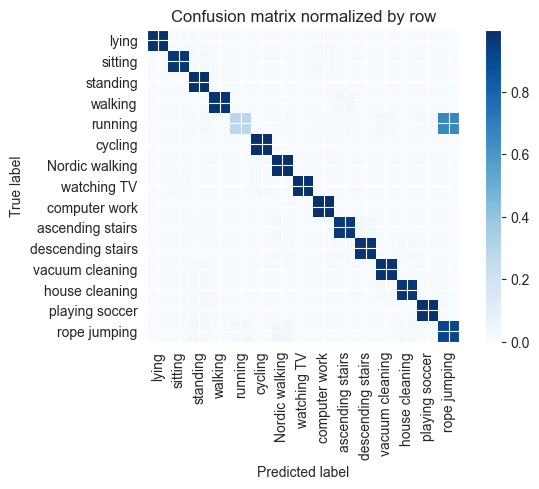

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.998      0.995      0.142        634|	 standing: 0.002,	rope jumping: 0.000,	
          walking       1.000      0.977      0.988      0.105        469|	 ascending stairs: 0.017,	house cleaning: 0.002,	
   Nordic walking       0.974      0.992      0.983      0.084        376|	 cycling: 0.005,	rope jumping: 0.003,	
            lying       1.000      0.984      0.992      0.082        369|	 computer work: 0.005,	standing: 0.005,	
         standing       0.947      0.992      0.969      0.080        359|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.972      0.980      0.976      0.080        358|	 standing: 0.014,	rope jumping: 0.003,	
   house cleaning       0.985      0.973      0.979      0.076        339|	 vacuum cleaning: 0.015,	standing: 0.009,	
          cycling       0.985      0.997      0.991      

unseen: 100%|██████████| 60/60 [00:04<00:00, 12.62batch/s, loss=343]


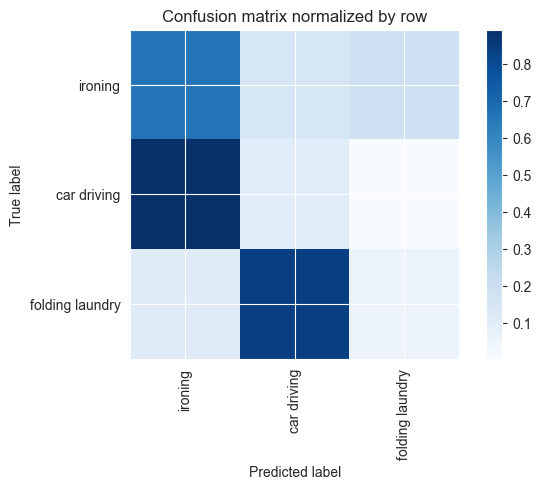

Overall accuracy: 0.430

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.725      0.662      0.692      0.607       2332|	 folding laundry: 0.191,	car driving: 0.148,	
folding laundry       0.106      0.055      0.072      0.253        972|	 car driving: 0.836,	ironing: 0.109,	
    car driving       0.046      0.104      0.064      0.140        536|	 ironing: 0.892,	folding laundry: 0.004,	

----------------------------------------------------------------------------------------------------
    avg / total       0.474      0.430      0.447        1.0       3840|	      

{'accuracy': 0.43020833333333336, 'precision': 0.2925338046935248, 'recall': 0.2735560562672383, 'f1': 0.2760436295603336}
============== Overall Unseen Classes Performance ==============


accuracy     0.353667
precision    0.290682
recall       0.317357
f1           0.264905
dtype: float64

In [57]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("=" * 16, f'Fold-{i}', "=" * 16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'],
                                    unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21,
                                    resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat,
                             attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'],
                            attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat,
                            attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)

    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'], weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt, optimizer, loss_module, device,
                                   class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt, loss_module, device,
                                 class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True,
                                 loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())

    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model, notebook_iden, model_iden, i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl, test_dt, loss_module, device,
                             class_names=[all_classes[i] for i in unseen_classes], phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("=" * 40)

print("=" * 14, "Overall Unseen Classes Performance", "=" * 14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
